In [1]:
import numpy as np
import matplotlib.pyplot as plt
import hera_cal.abscal as abscal
import uvtools.dspec as dspec 
import hera_pspec
from hera_pspec import pspecbeam
from hera_pspec import pspecdata
import itertools
import scipy 
from scipy import signal
import pickle
import copy
from hera_cal.utils import polnum2str, polstr2num, jnum2str, jstr2num
from hera_cal.io import HERAData, HERACal
from hera_cal.io import DataContainer 
from hera_cal import apply_cal
from hera_cal import io
from hera_cal import smooth_cal
from hera_cal import vis_clean
from hera_cal import redcal
from pyuvdata import UVFlag
import glob
import tqdm
import os
import shutil
from hera_cal import frf
import imp
from hera_pspec import utils as uvp_utils
from hera_pspec import plot as pspec_plot
from hera_pspec import grouping

/users/kshahin/miniconda2/envs/hera3/lib/python3.7/site-packages/hera_sim/visibilities/__init__.py:22: UserWarning: HealVis failed to import.
  warnings.warn("HealVis failed to import.")
/users/kshahin/miniconda2/envs/hera3/lib/python3.7/site-packages/hera_sim/visibilities/__init__.py:27: UserWarning: PRISim failed to import.
  warnings.warn("PRISim failed to import.")
/users/kshahin/miniconda2/envs/hera3/lib/python3.7/site-packages/hera_sim/visibilities/__init__.py:33: UserWarning: VisGPU failed to import.
  warnings.warn("VisGPU failed to import.")
/users/kshahin/miniconda2/envs/hera3/lib/python3.7/site-packages/hera_sim/__init__.py:36: FutureWarning: 
In the next major release, all HERA-specific variables will be removed from the codebase. The following variables will need to be accessed through new class-like structures to be introduced in the next major release: 

noise.HERA_Tsky_mdl
noise.HERA_BEAM_POLY
sigchain.HERA_NRAO_BANDPASS
rfi.HERA_RFI_STATIONS

Additionally, the next maj

In [71]:
#Discrete Fourier Transform 

def fft(x):
    bh = dspec.gen_window('bh', (x.shape[1]))
    return np.abs(np.fft.fftshift(np.fft.fft(np.fft.fftshift(bh*x))))

In [20]:
%config Completer.use_jedi = False

In [6]:
#Scale Plot/Figure Sizes

plt.rcParams['figure.figsize'] = 20,10
plt.rcParams['font.size'] = 20

In [17]:
#Loading Data, Model, and Flags

flag_files = [f"/lustre/aoc/projects/hera/aewallwi/H1C_flags/{jd}.flags.h5" for jd in [2458098,2458099,2458101,2458102,
                                                                                       2458103,2458104,2458105,2458106,
                                                                                       2458107,2458108,2458109,2458110,
                                                                                       2458111,2458112,2458113,2458114,
                                                                                       2458115,2458116]]
model_files = '/lustre/aoc/projects/hera/schoudhu/vis_redun_60time.uvh5'
data_files = '/lustre/aoc/projects/hera/schoudhu/vis_ellip_60time.uvh5'
old_files = '/lustre/aoc/projects/hera/aewallwi/time_dep_flagging/2458098/zen.2458098.26719.foregrounds.true.uvh5'

bad_ants = [np.loadtxt(f"/users/kshahin/kshahin/HERA_Calibration/hera_pipelines/pipelines/h1c/idr2/v2/bad_ants/{ba}.txt") for ba in [2458098,2458099,2458101,2458102,2458103,2458104,2458105,2458106,2458107,2458108,2458109,2458110,2458111,2458112,2458113,2458114,2458115,2458116]]
bad_ant = bad_ants[0]

In [25]:
hd_data = HERAData(data_files)
data,flags,nsamples = hd_data.read()

hd_model = HERAData(model_files)
model, flags_model, nsamples_model = hd_model.read()

hd = HERAData(old_files)
old_data, old_flags, old_nsamples = hd.read()


Telescope hera_sim is not in known_telescopes.
Telescope hera_sim is not in known_telescopes.
Telescope RIMEz calculation is not in known_telescopes.


There are 33 antennas and they are: [ 0  1  2 11 12 13 14 23 24 25 26 27 36 37 38 39 40 41 50 51 52 53 54 55
 66 67 68 69 70 83 84 85 86]

There are 614 frequencies, covering a range of 115.053763 MHz to 174.8779691255616 MHz.

There are 60 time inteMagrations.
1. The width of each frequency channel is 0.09759250591444969 MHz.

2. The Julian Dates range from 2458098.26725585 to 2458098.274583049

3. The integration time is 10.730016231536865 seconds.

4. The LSTs range from 1.1539691683124846 to 1.3303034061375028 hours.

5. There are 561 baselines but there should be N*(N-1)/2*4 = 2112


Text(0.5, 1.0, 'HERA Antenna Positions')

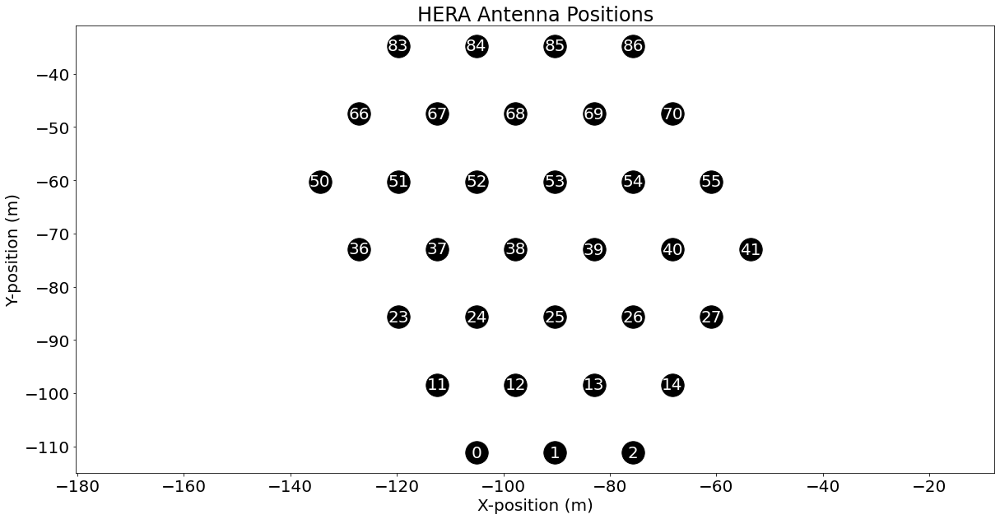

In [132]:
print('There are', len(hd.ants), 'antennas and they are:', hd.ants)

print('\nThere are', len(hd.freqs), 'frequencies, covering a range of',
      np.min(hd.freqs) / 1e6, 'MHz to', np.max(hd.freqs) / 1e6,'MHz.')

print('\nThere are', len(hd.times), 'time inteMagrations.')

print('1. The width of each frequency channel is', (hd.freqs[1] - hd.freqs[0]) / 1e6, 'MHz.')

print('\n2. The Julian Dates range from', np.min(hd.times), 'to', np.max(hd.times))

print('\n3. The integration time is', np.median(np.diff(hd.times)) * 24 * 3600, 'seconds.')

print('\n4. The LSTs range from', np.min(hd.lsts)*12/np.pi, 'to', np.max(hd.lsts)*12/np.pi, 'hours.')

print('\n5. There are', len(hd.bls), 'baselines but there should be N*(N-1)/2*4 =', 
      int(len(hd.ants)*(len(hd.ants)-1)/2*4))


xs = [hd.antpos[ant][0] for ant in hd.ants]
ys = [hd.antpos[ant][1] for ant in hd.ants]

plt.figure()
plt.scatter(xs, ys, marker='.', color='k', s=3000) # plot the antenna positions with black circles
for i, ant in enumerate(hd.ants): # loop over antennas
    plt.text(xs[i], ys[i], ant, color='w', va='center', ha='center') # label antenna numbers
plt.xlabel('X-position (m)')
plt.ylabel('Y-position (m)')
plt.axis('equal');
plt.title("HERA Antenna Positions")
#plt.savefig('HERA_antpos.pdf')

In [21]:
hds = HERAData(f"/users/kshahin/kshahin/HERA_Calibration/Day_0/data_0_0_filtered.uvh5")
datas, flagss, nsampless = hds.read()
bh = dspec.gen_window('bh',614)
jul = 24*3600             #julian date to seconds
interpolated_times = (hds.times -hds.times.min())*jul
delay_blh = np.fft.fftshift(np.fft.fftfreq(len(bh),datas.freqs[1] - datas.freqs[0]))
ext = (delay_blh.min()*1e+9, delay_blh.max()*1e+9, interpolated_times.max(), interpolated_times.min())
ext2 = (datas.freqs[0]/1e6, datas.freqs[-1]/1e6, interpolated_times.max(), interpolated_times.min())

Telescope hera_sim is not in known_telescopes.


Telescope hera_sim is not in known_telescopes.


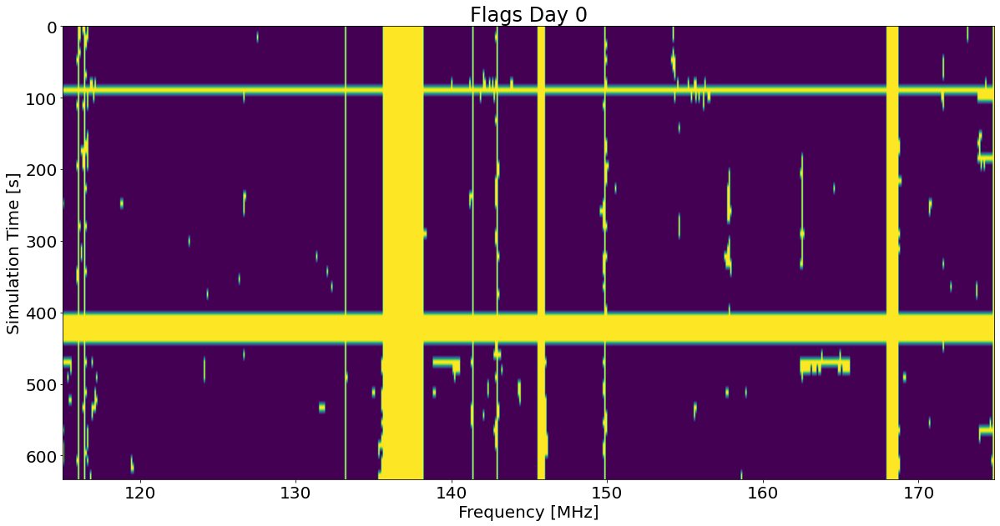

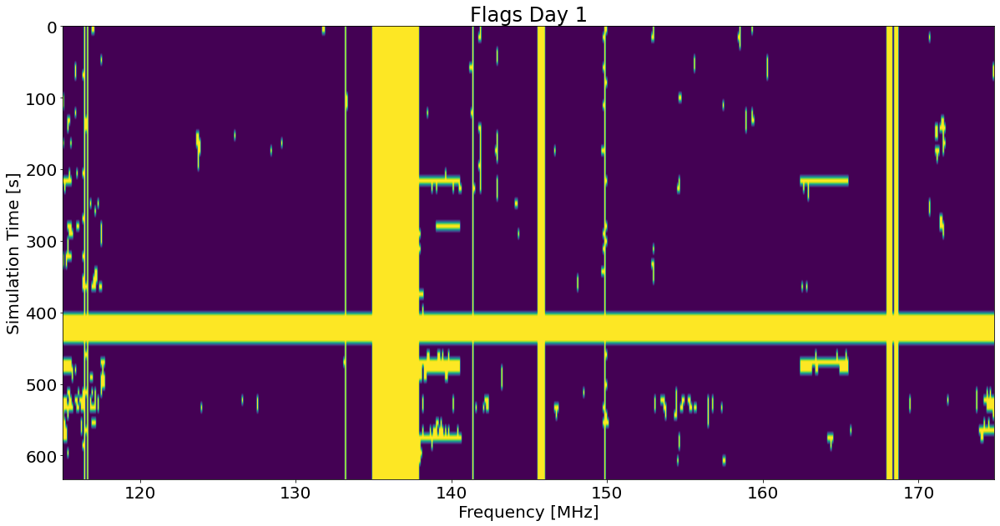

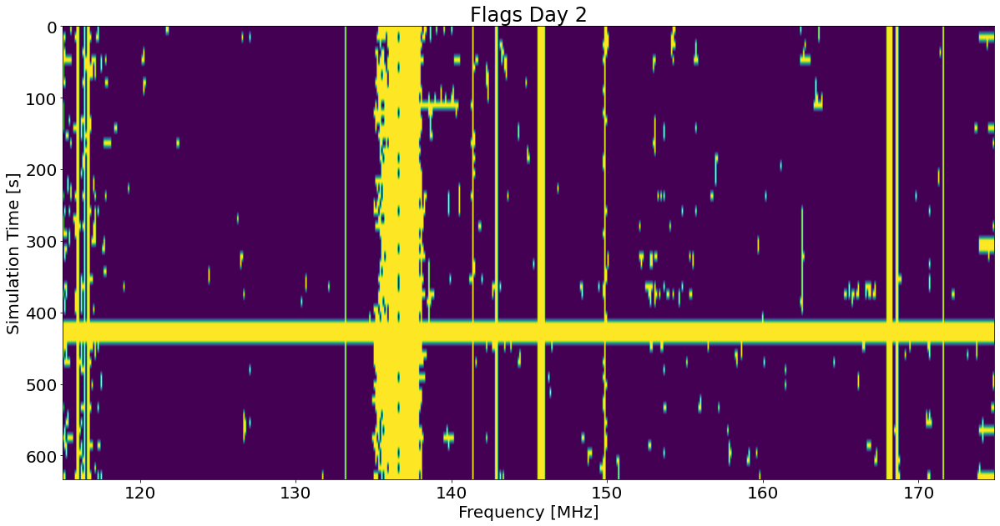

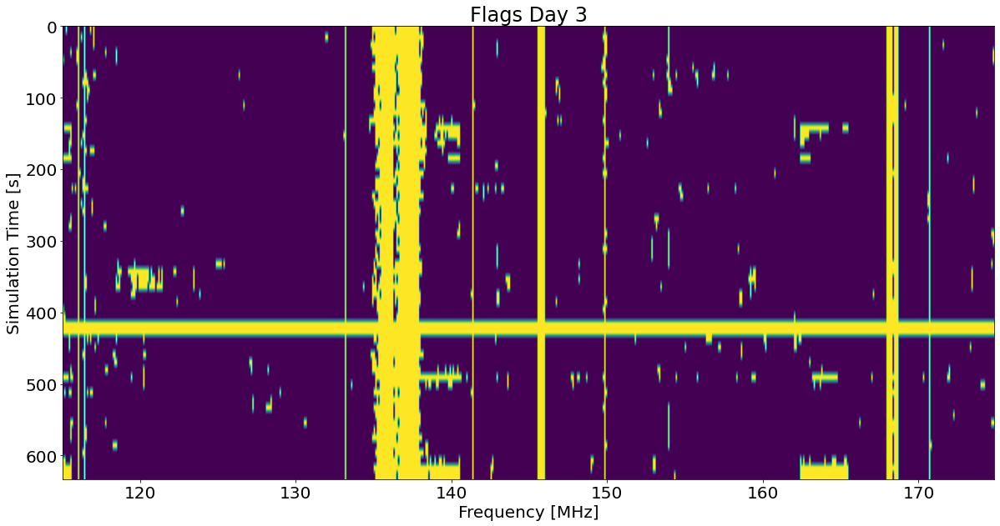

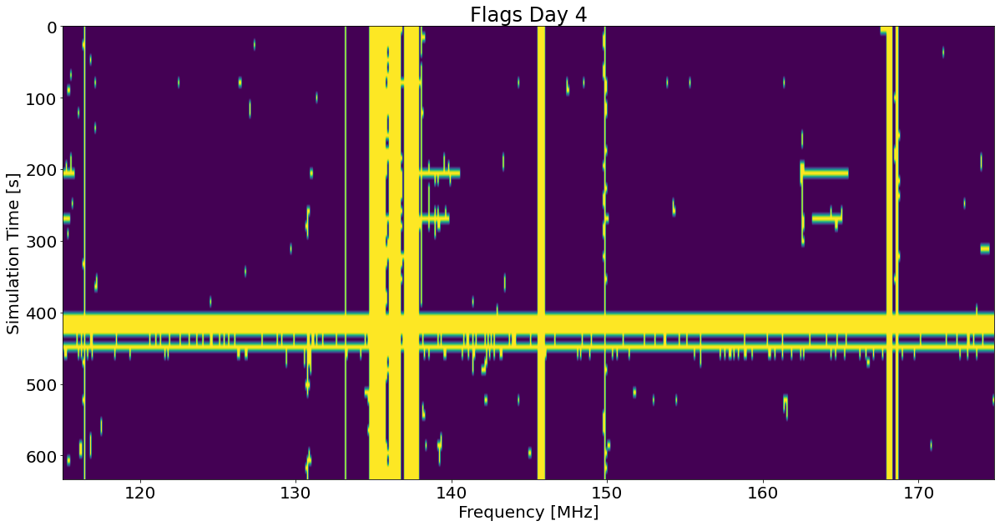

...

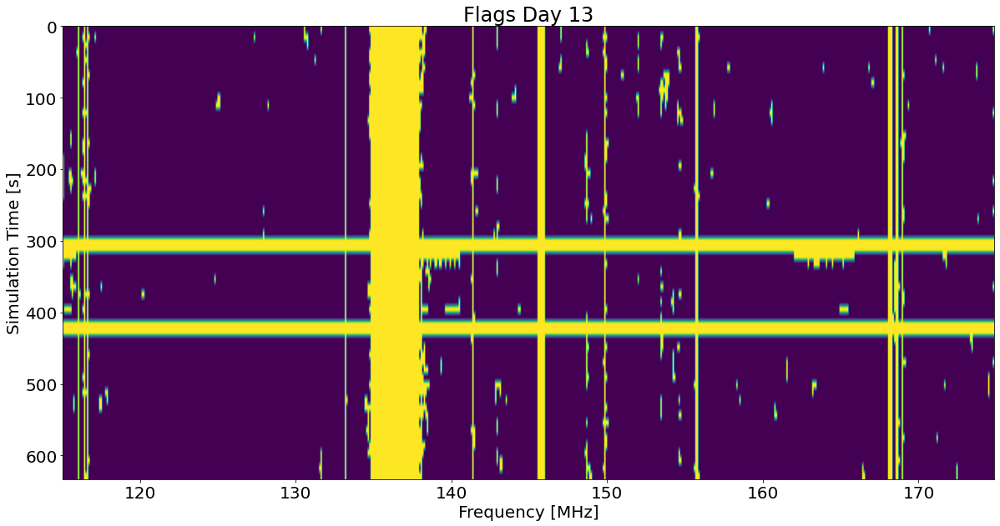

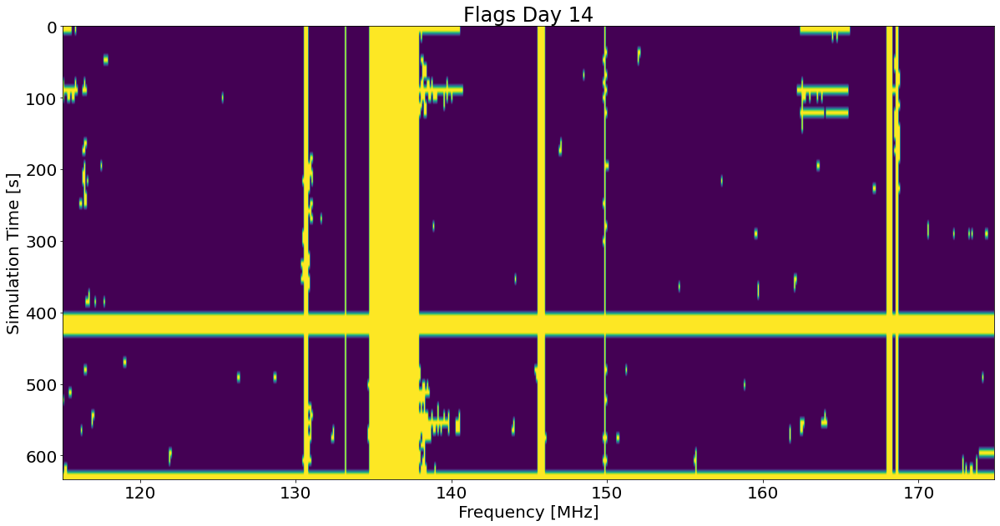

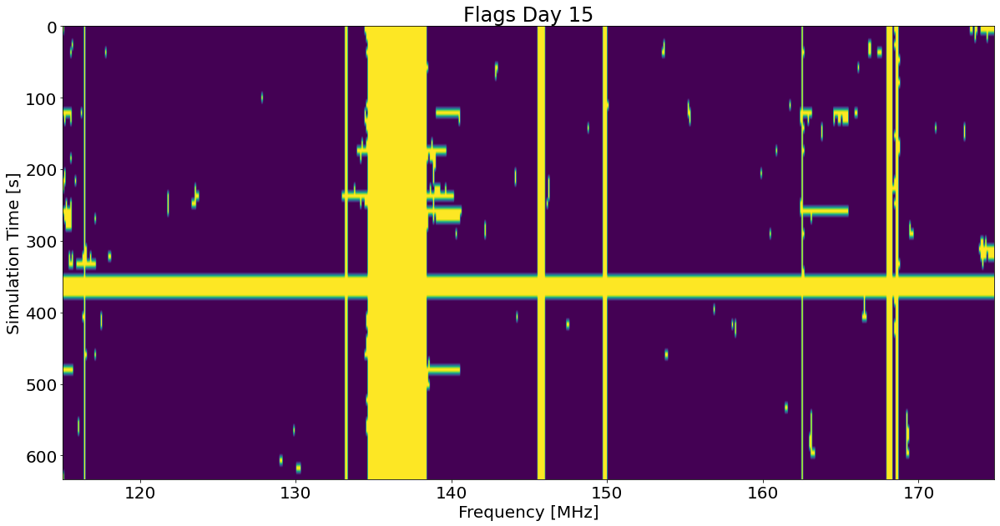

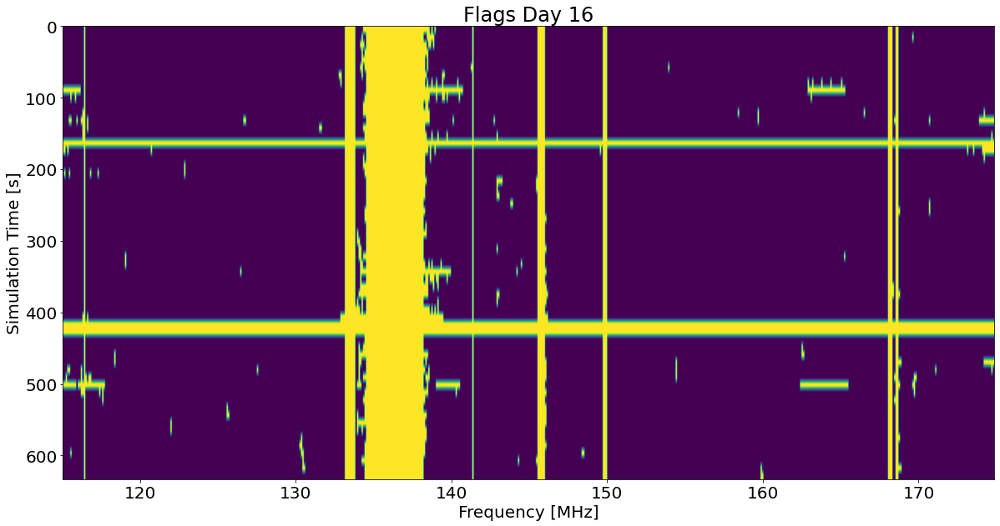

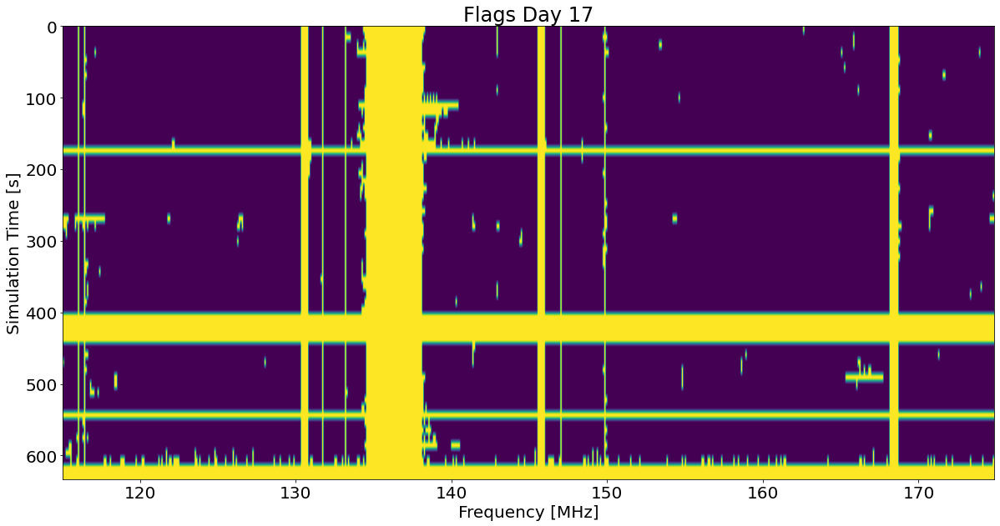

In [89]:
data, flag, nsample = hd_data.read(polarizations=["ee"], frequencies=freqs)
for day in range(0,18):
    flags = UVFlag(flag_files[day])
    flags.select(frequencies = flags.freq_array[(flags.freq_array>=115*1e+6) & (flags.freq_array<175*1e+6)])
    flags.select(times=flags.time_array[2600:2660])
    freqs = hd_data.freqs[(hd_data.freqs>=115*1e+6) & (hd_data.freqs<175*1e+6)]
    for bl in data:
        if (bl[0] == bad_ant).any() or (bl[1] == bad_ant).any():
                    flag[bl] = np.ones_like(flag[bl])
        flag[bl] = flags.flag_array.squeeze()
    plt.figure()
    plt.imshow(flag[(0,1,'ee')], aspect='auto', extent= ext2)
    plt.xlabel('Frequency [MHz]')
    plt.ylabel('Simulation Time [s]')
    plt.title(f'Flags Day {day}')

Text(0.5, 1.0, 'Initial Data')

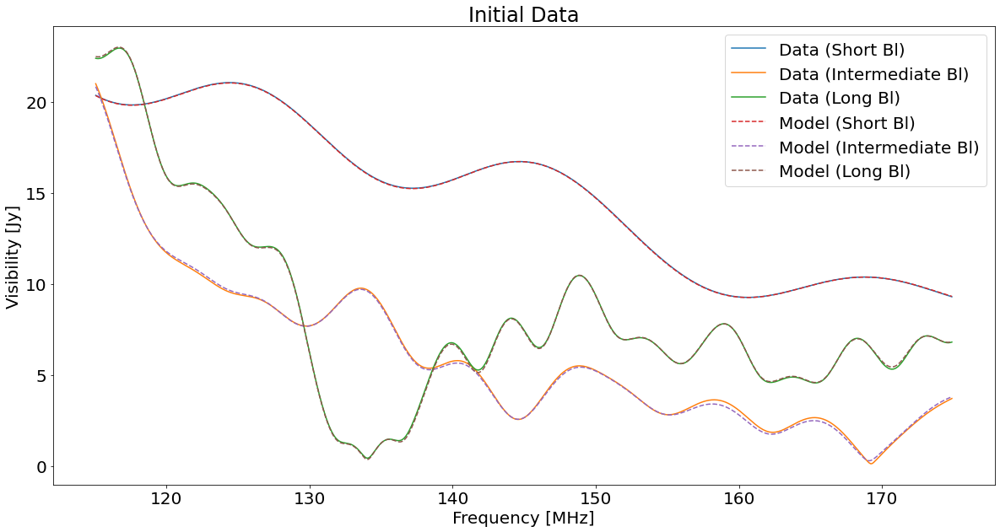

In [42]:
#Short BL = (0,1,'ee')
#Intermediate BL = (11,14,'ee')
#Long BL = (36,41,'ee')

plt.plot(data.freqs/1e+6, abs(data[(0,1,'ee')][0]/~flags[(0,1,'ee')][0]), label='Data (Short Bl)')
plt.plot(data.freqs/1e+6, abs(data[(11,14,'ee')][0]/~flags[(11,14,'ee')][0]), label='Data (Intermediate Bl)')
plt.plot(data.freqs/1e+6, abs(data[(36,41,'ee')][0]/~flags[(36,41,'ee')][0]), label='Data (Long Bl)')
plt.plot(model.freqs/1e+6, abs(model[(0,1,'ee')][0]/~flags[(0,1,'ee')][0]),linestyle='--', label='Model (Short Bl)')
plt.plot(model.freqs/1e+6, abs(model[(11,14,'ee')][0]/~flags[(11,14,'ee')][0]),linestyle='--', label='Model (Intermediate Bl)')
plt.plot(model.freqs/1e+6, abs(model[(36,41,'ee')][0]/~flags[(36,41,'ee')][0]),linestyle='--', label='Model (Long Bl)')
plt.ylabel('Visibility [Jy]')
plt.xlabel('Frequency [MHz]')
plt.legend()
plt.title('Initial Data')

Text(0.5, 1.0, 'Initial Data[Long BL (36,41)]')

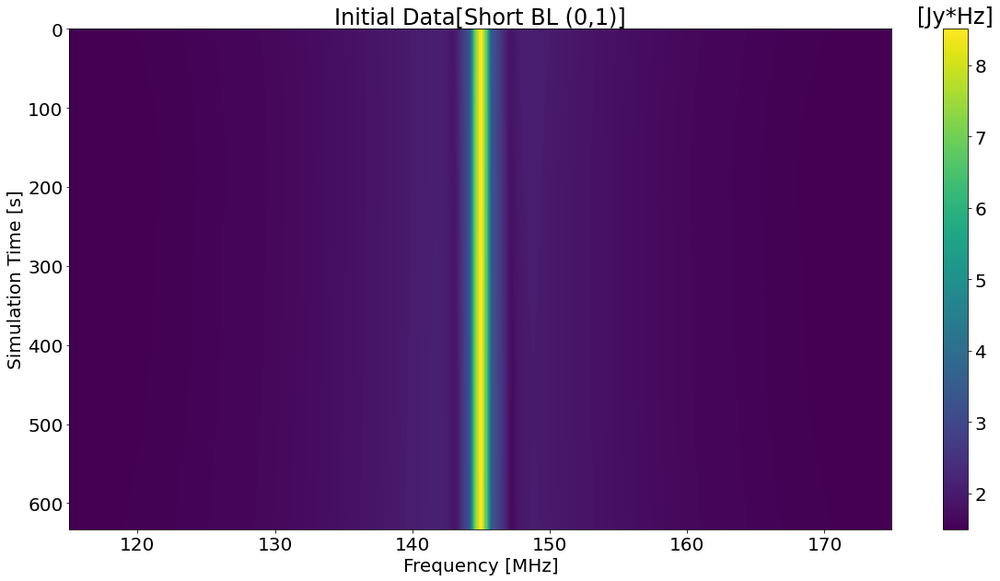

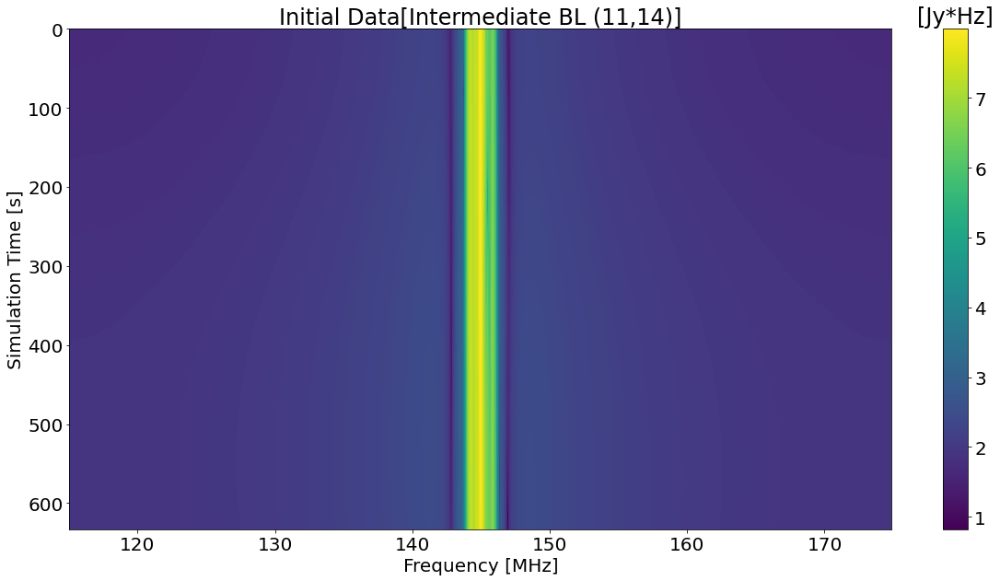

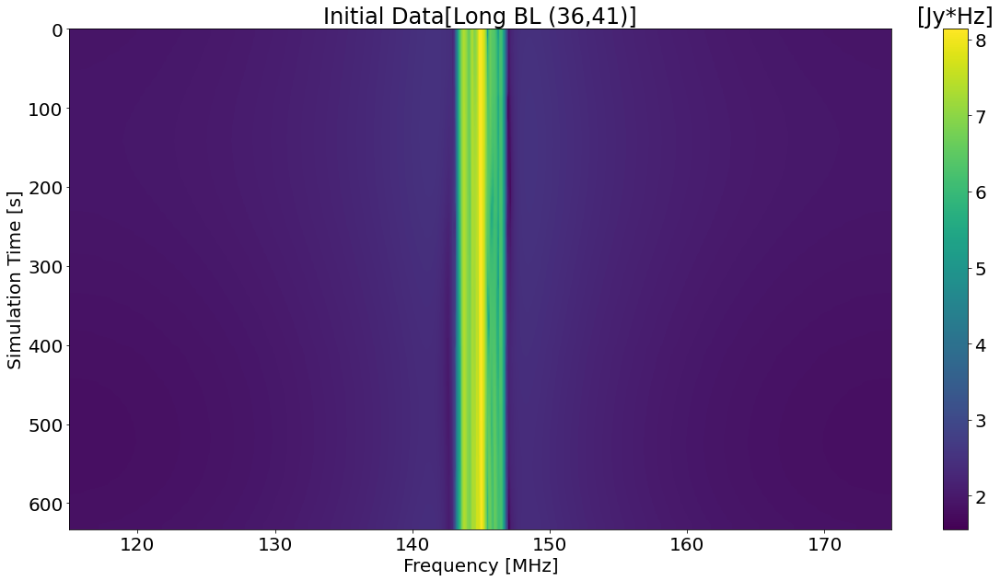

In [26]:
plt.imshow(np.log10(np.abs(fft(data[(0, 1, 'ee')]*(data.freqs[1]-data.freqs[0])))), extent=ext2, aspect='auto')
clb = plt.colorbar()
clb.ax.set_title('[Jy*Hz]')
plt.xlabel('Frequency [MHz]')
plt.ylabel('Simulation Time [s]')
plt.title('Initial Data[Short BL (0,1)]')
plt.figure()
plt.imshow(np.log10(np.abs(fft(data[(11, 14, 'ee')]*(data.freqs[1]-data.freqs[0])))), extent=ext2, aspect='auto')
clb = plt.colorbar()
clb.ax.set_title('[Jy*Hz]')
plt.xlabel('Frequency [MHz]')
plt.ylabel('Simulation Time [s]')
plt.title('Initial Data[Intermediate BL (11,14)]')
plt.figure()
plt.imshow(np.log10(np.abs(fft(data[(36, 41, 'ee')]*(data.freqs[1]-data.freqs[0])))), extent=ext2, aspect='auto')
clb = plt.colorbar()
clb.ax.set_title('[Jy*Hz]')
plt.xlabel('Frequency [MHz]')
plt.ylabel('Simulation Time [s]')
plt.title('Initial Data[Long BL (36,41)]')

No handles with labels found to put in legend.
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting c

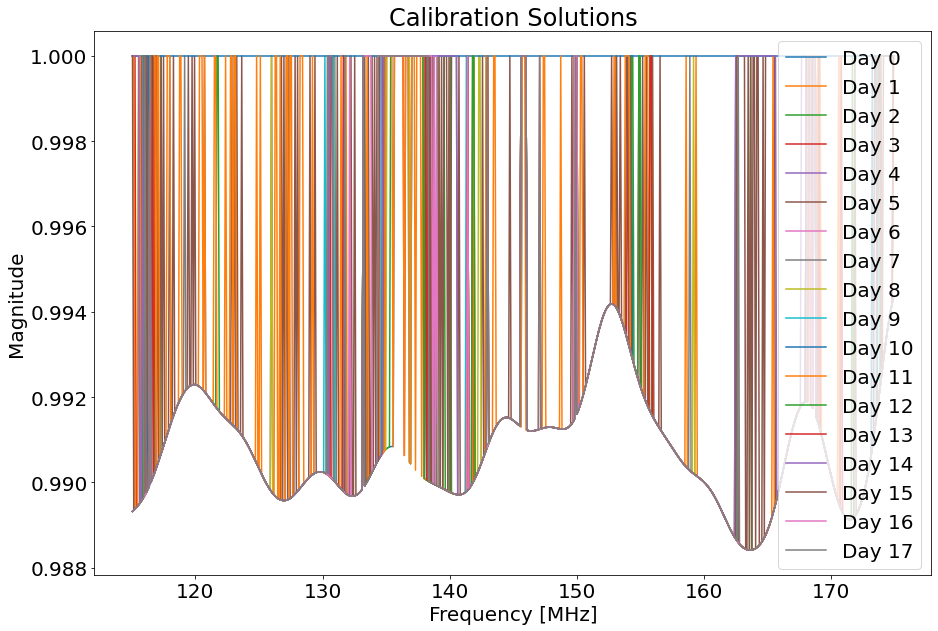

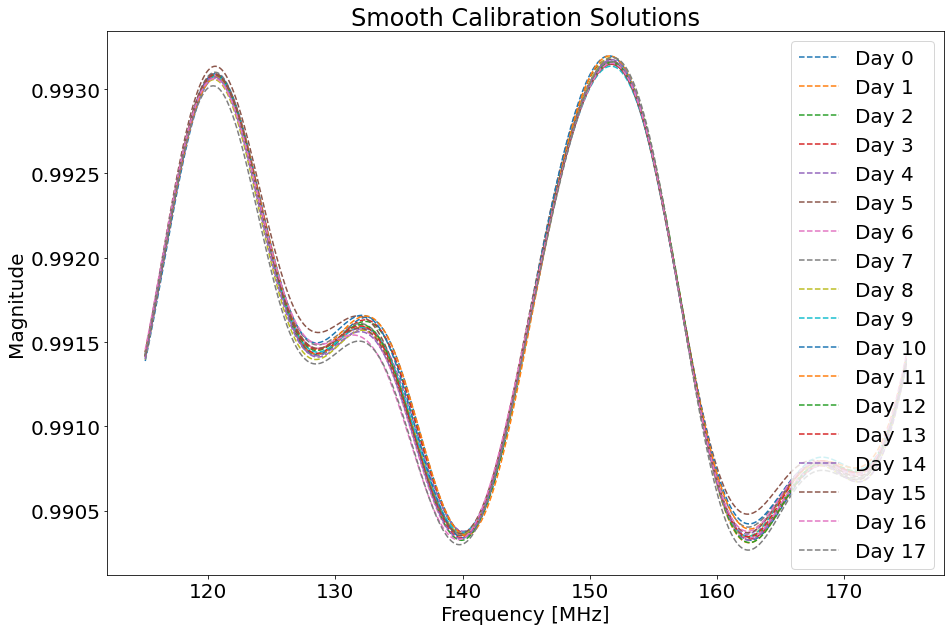

In [85]:
#Gains vs Smooth Gains
day=0
plt.figure(figsize=(15,10))
plt.ylabel('Magnitude')
plt.xlabel('Frequency [MHz]')
plt.legend()
plt.title('Calibration Solutions')
for day in range(0,18):
    hc = io.HERACal(f"/users/kshahin/kshahin/HERA_Calibration/Day_{day}/data_{day}_0.abs.calfits")
    gains, flags, _, _ = hc.read()
    plt.plot(data.freqs/1e6, gains[(0,'Jee')][0], label=f'Day {day}')
plt.legend()
plt.figure(figsize=(15,10))
plt.ylabel('Magnitude')
plt.xlabel('Frequency [MHz]')
plt.legend()
plt.title('Smooth Calibration Solutions')
for day in range(0,18):
    hcs = io.HERACal(f"/users/kshahin/kshahin/HERA_Calibration/Day_{day}/data_{day}_0.smooth_abs.calfits")
    gains_smooth, flags_smooth, _, _ = hcs.read()
    plt.plot(data.freqs/1e6, gains_smooth[(0,'Jee')][0],ls='--', label=f'Day {day}')
plt.legend()

Text(0.5, 1.0, 'Smooth Antenna Gains (Day 0)')

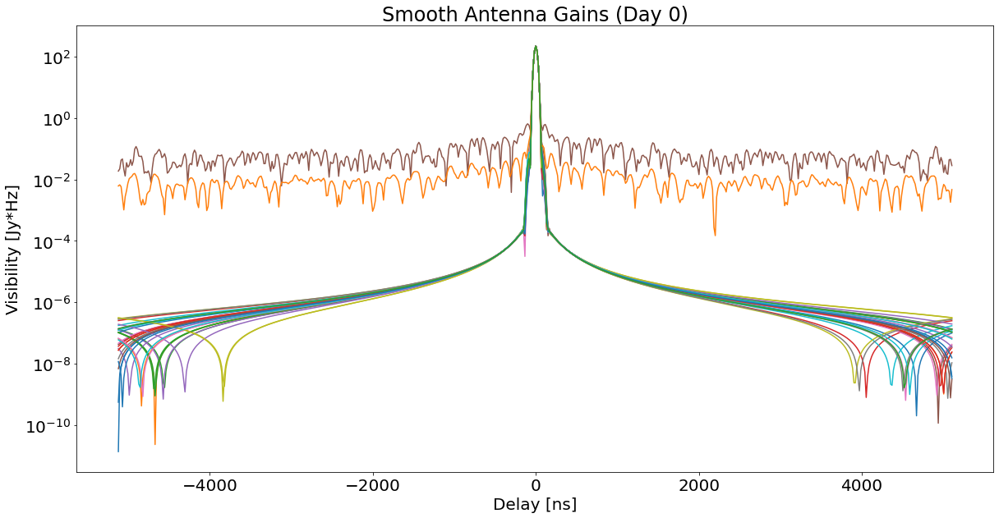

In [66]:
def oldfft(x):
    return np.abs(np.fft.fftshift(np.fft.fft(np.fft.fftshift(x))))
for ant in data.data_ants:
    plt.plot(delay_blh*1e9, oldfft(bh*(1/gains_smooth[(ant,'Jee')][0])), label=f'Ant {ant}')
# plt.legend()
plt.yscale('log')
plt.xlabel('Delay [ns]')
plt.ylabel('Visibility [Jy*Hz]')
plt.title('Smooth Antenna Gains (Day 0)')

Telescope hera_sim is not in known_telescopes.
Telescope hera_sim is not in known_telescopes.
Telescope hera_sim is not in known_telescopes.
Telescope hera_sim is not in known_telescopes.
Telescope hera_sim is not in known_telescopes.
Telescope hera_sim is not in known_telescopes.
Telescope hera_sim is not in known_telescopes.
Telescope hera_sim is not in known_telescopes.
Telescope hera_sim is not in known_telescopes.
Telescope hera_sim is not in known_telescopes.
Telescope hera_sim is not in known_telescopes.
Telescope hera_sim is not in known_telescopes.
Telescope hera_sim is not in known_telescopes.
Telescope hera_sim is not in known_telescopes.
Telescope hera_sim is not in known_telescopes.
Telescope hera_sim is not in known_telescopes.
Telescope hera_sim is not in known_telescopes.
Telescope hera_sim is not in known_telescopes.


Text(0.5, 1.0, 'Smooth Calibration Days(0-17)')

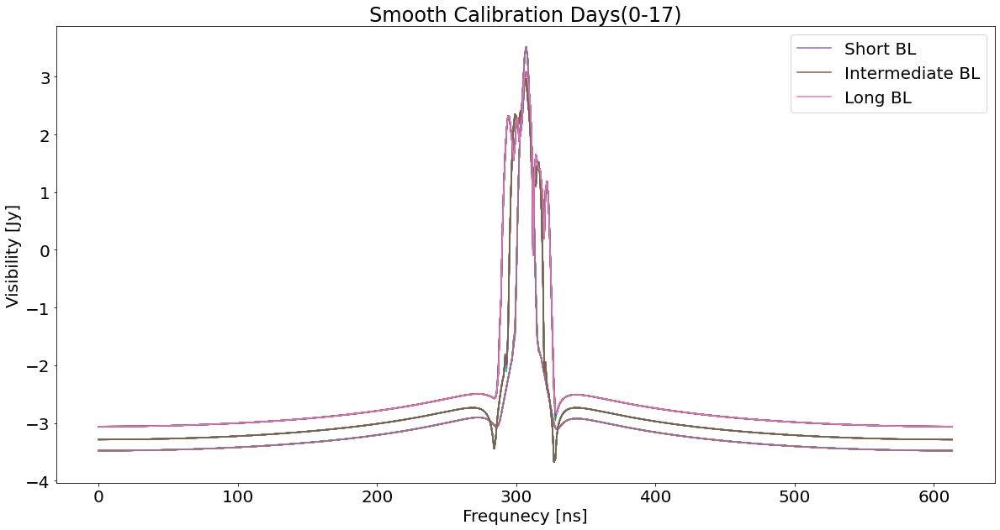

In [90]:
for day in range(0,18):
    hd = HERAData(f"/users/kshahin/kshahin/HERA_Calibration/Day_{day}/data_{day}_0_smoothcal.uvh5")
    data, flags, nsamples = hd.read()
    plt.plot(np.log10(np.abs(oldfft(bh*(data[(0, 1, 'ee')][0])))))
    plt.plot(np.log10(np.abs(oldfft(bh*(data[(11, 14, 'ee')][0])))))
    plt.plot(np.log10(np.abs(oldfft(bh*(data[(36, 41, 'ee')][0])))))
plt.plot(np.log10(np.abs(oldfft(bh*(data[(0, 1, 'ee')][0])))), label='Short BL')
plt.plot(np.log10(np.abs(oldfft(bh*(data[(11, 14, 'ee')][0])))), label='Intermediate BL')
plt.plot(np.log10(np.abs(oldfft(bh*(data[(36, 41, 'ee')][0])))), label='Long BL')
plt.xlabel('Frequnecy [ns]')
plt.ylabel('Visibility [Jy]')
plt.legend()
plt.title('Smooth Calibration Days(0-17)')

Telescope hera_sim is not in known_telescopes.
Telescope hera_sim is not in known_telescopes.
Telescope hera_sim is not in known_telescopes.
Telescope hera_sim is not in known_telescopes.
Telescope hera_sim is not in known_telescopes.
Telescope hera_sim is not in known_telescopes.
Telescope hera_sim is not in known_telescopes.
Telescope hera_sim is not in known_telescopes.
Telescope hera_sim is not in known_telescopes.
Telescope hera_sim is not in known_telescopes.
Telescope hera_sim is not in known_telescopes.
Telescope hera_sim is not in known_telescopes.
Telescope hera_sim is not in known_telescopes.
Telescope hera_sim is not in known_telescopes.
Telescope hera_sim is not in known_telescopes.
Telescope hera_sim is not in known_telescopes.
Telescope hera_sim is not in known_telescopes.
Telescope hera_sim is not in known_telescopes.


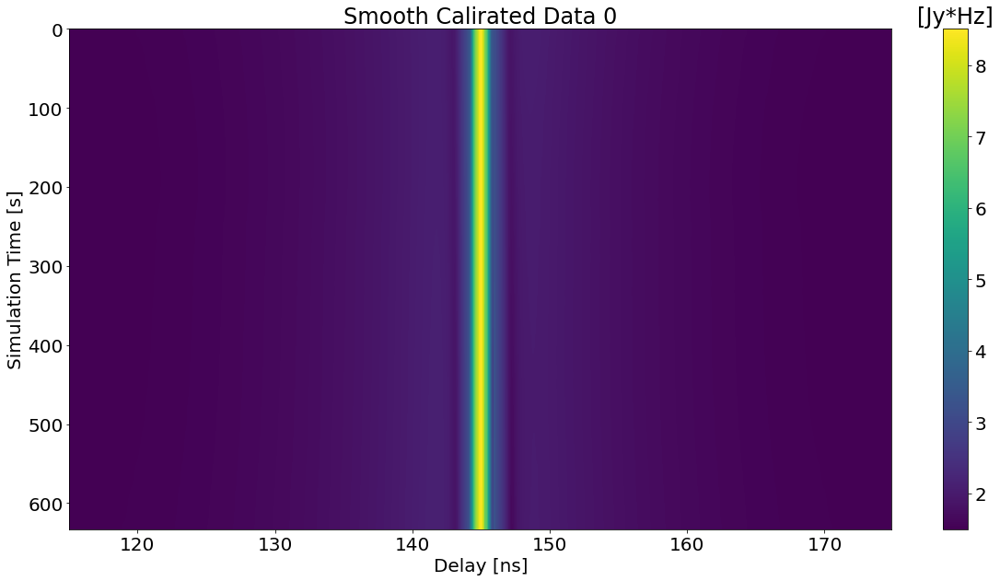

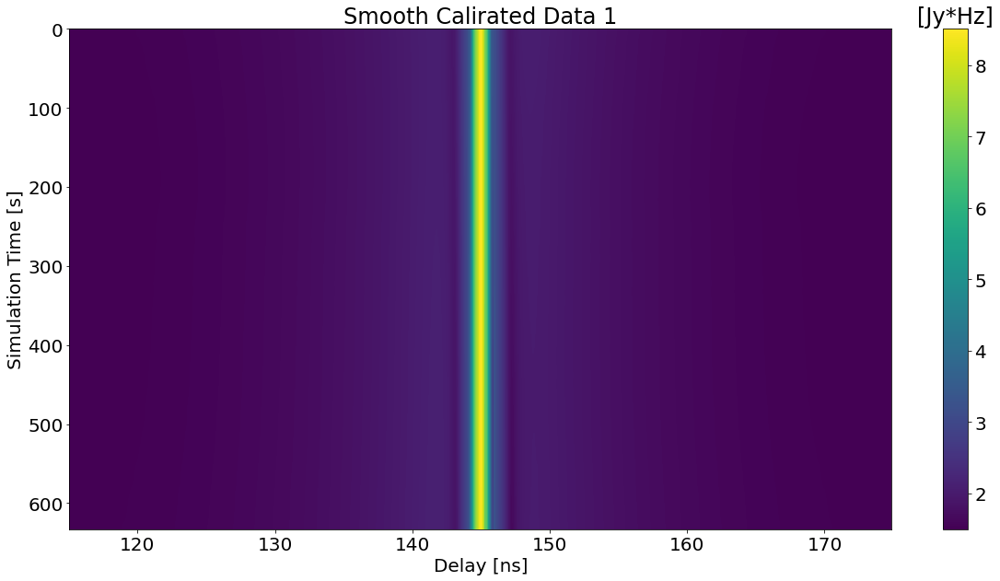

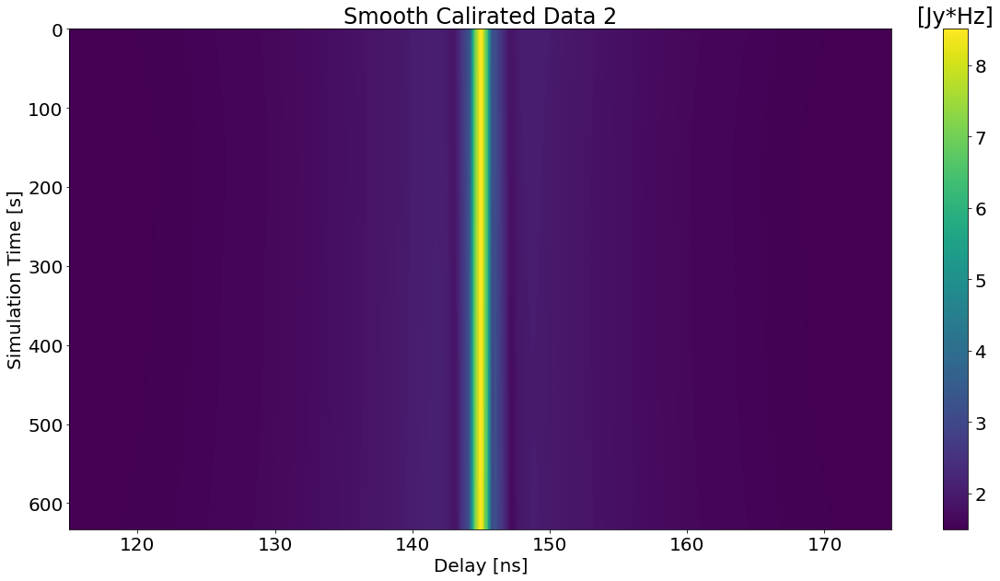

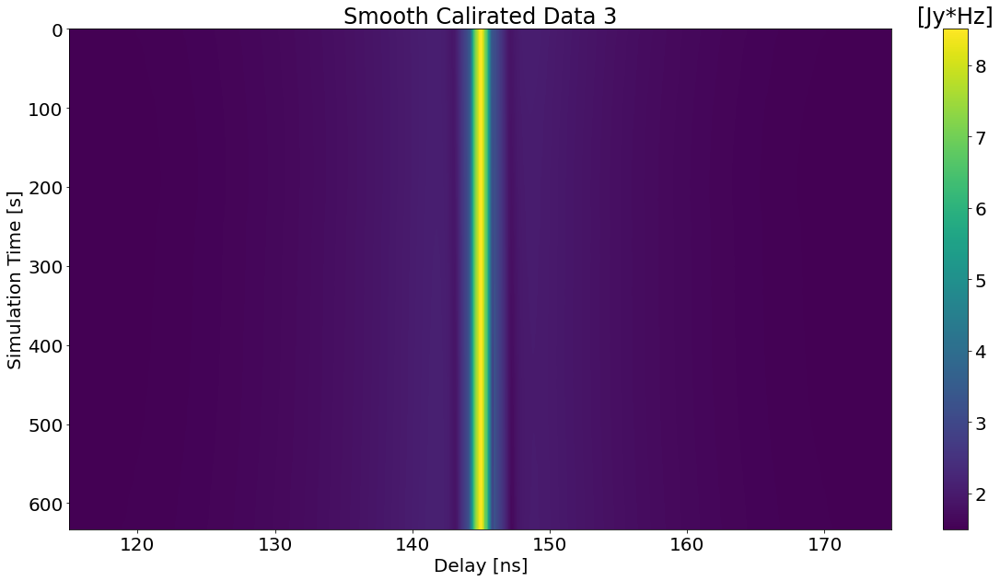

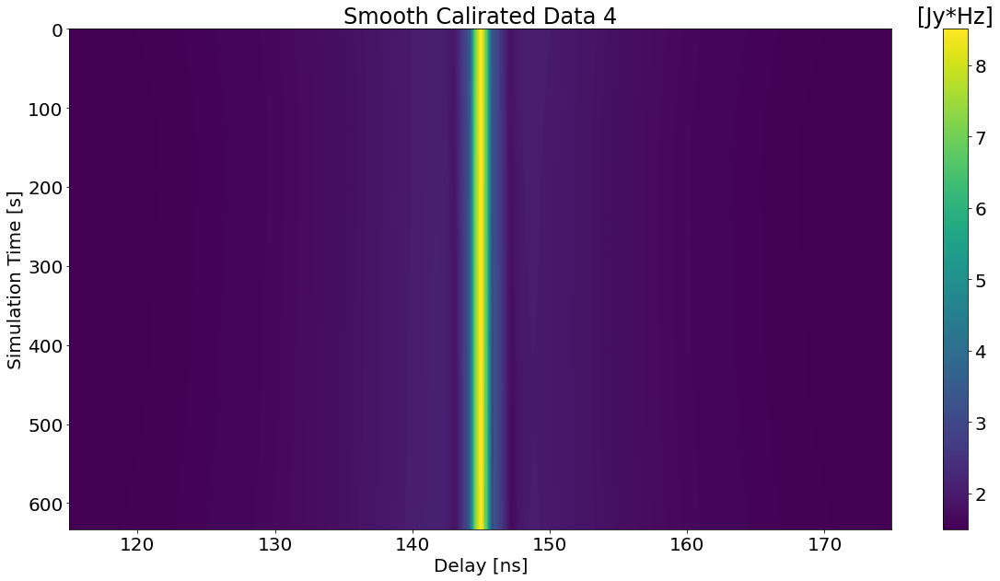

...

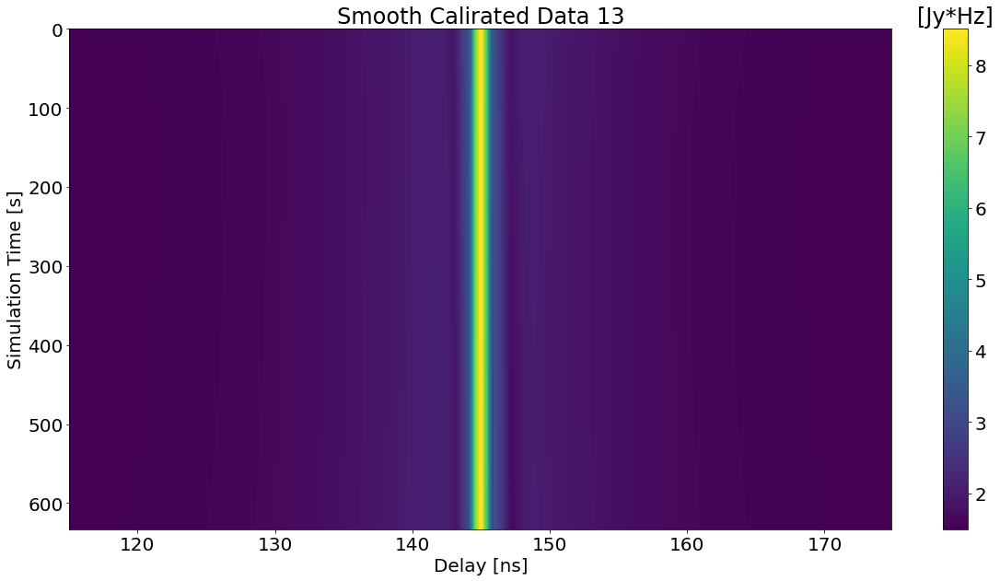

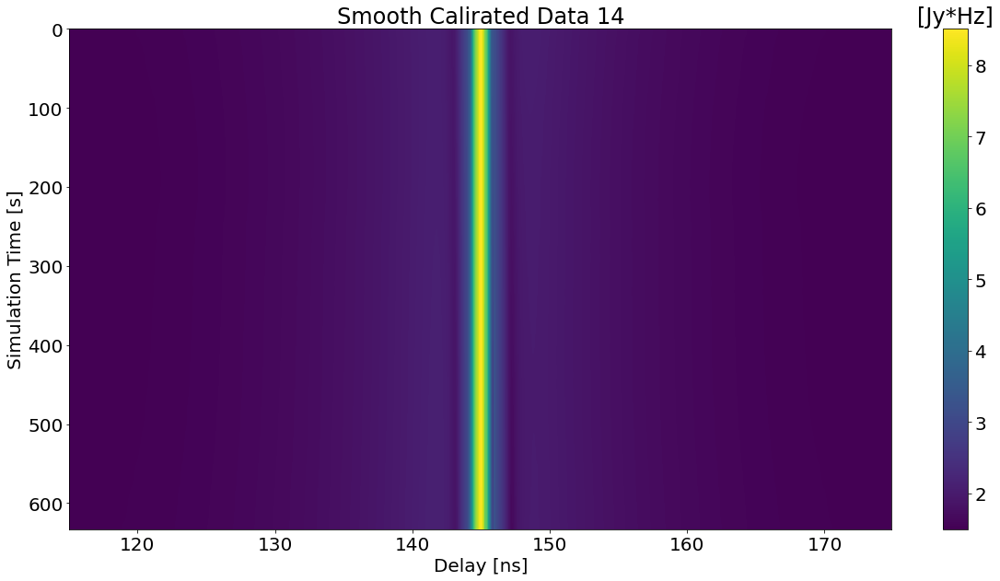

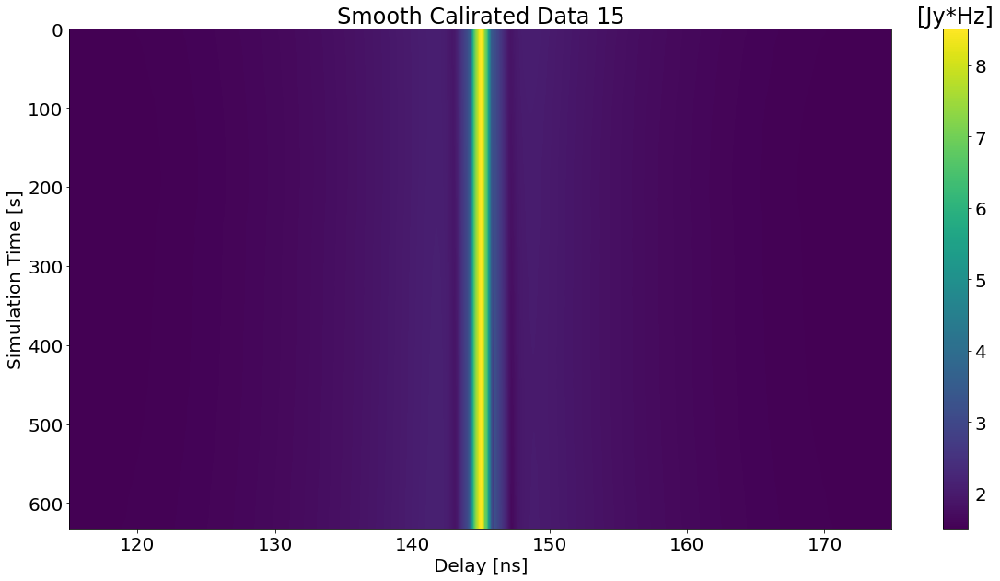

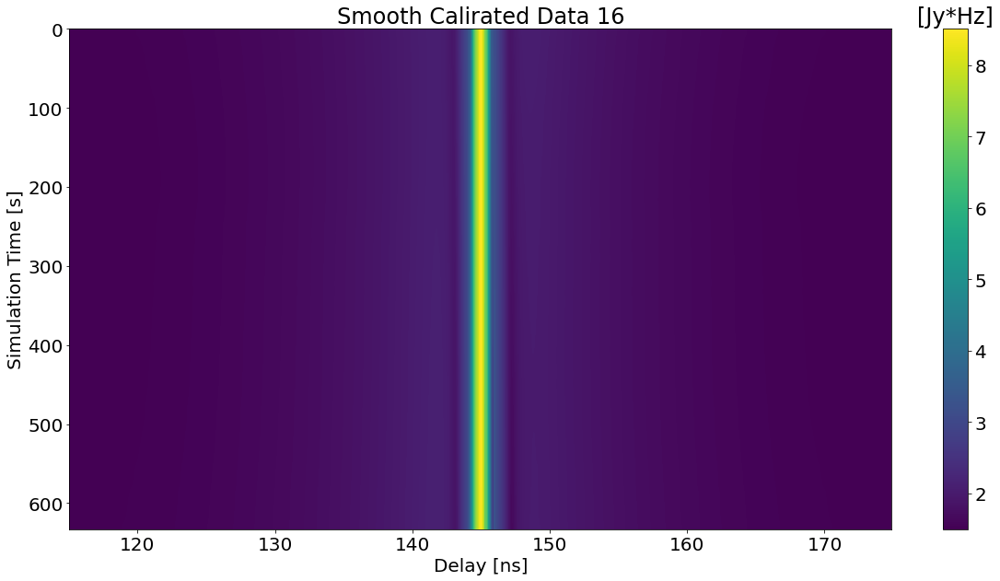

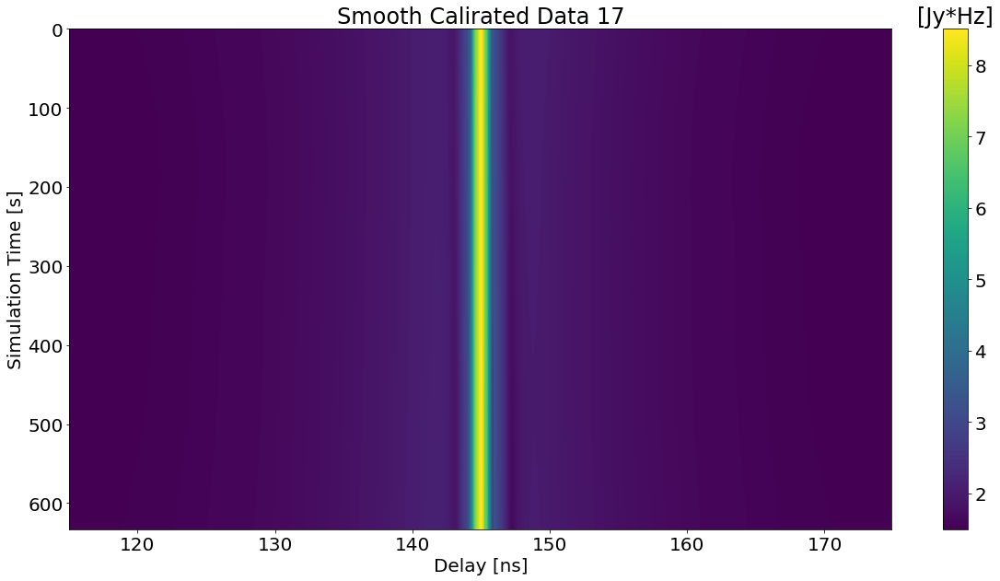

In [91]:
for day in range(0,18):
    hd = HERAData(f"/users/kshahin/kshahin/HERA_Calibration/Day_{day}/data_{day}_0_smoothcal.uvh5")
    data, flags, nsamples = hd.read()
    plt.figure()
    plt.imshow(np.log10(np.abs(fft(data[(0, 1, 'ee')]*(data.freqs[1]-data.freqs[0])))), extent=ext2, aspect='auto')
    clb = plt.colorbar()
    clb.ax.set_title('[Jy*Hz]')
    plt.xlabel('Delay [ns]')
    plt.ylabel('Simulation Time [s]')
    plt.title(f'Smooth Calirated Data {day}')

Telescope hera_sim is not in known_telescopes.
divide by zero encountered in log10
Telescope hera_sim is not in known_telescopes.
divide by zero encountered in log10
Telescope hera_sim is not in known_telescopes.
divide by zero encountered in log10
Telescope hera_sim is not in known_telescopes.
divide by zero encountered in log10
Telescope hera_sim is not in known_telescopes.
divide by zero encountered in log10
Telescope hera_sim is not in known_telescopes.
divide by zero encountered in log10
Telescope hera_sim is not in known_telescopes.
divide by zero encountered in log10
Telescope hera_sim is not in known_telescopes.
Telescope hera_sim is not in known_telescopes.
divide by zero encountered in log10
Telescope hera_sim is not in known_telescopes.
divide by zero encountered in log10
Telescope hera_sim is not in known_telescopes.
divide by zero encountered in log10
Telescope hera_sim is not in known_telescopes.
Telescope hera_sim is not in known_telescopes.
divide by zero encountered in

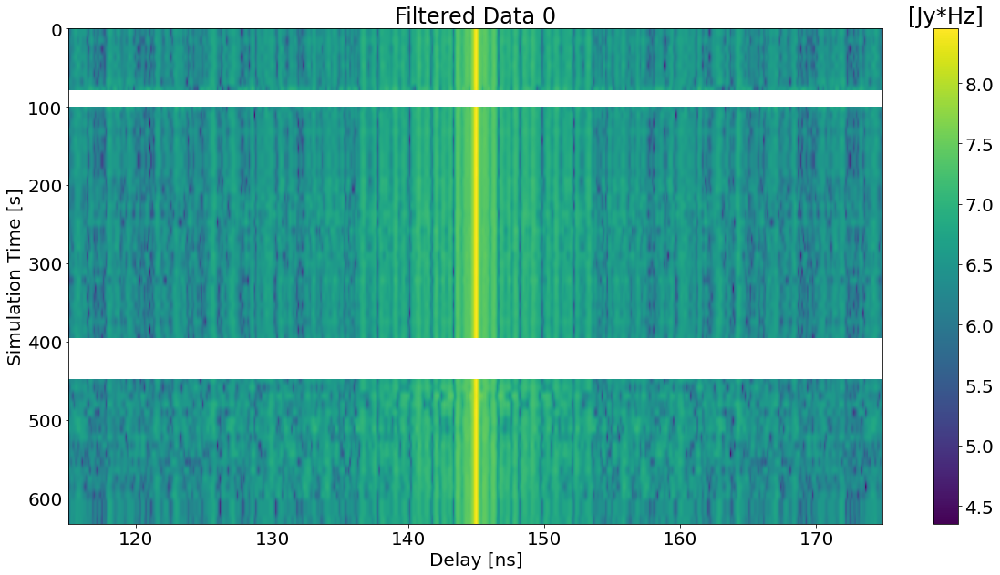

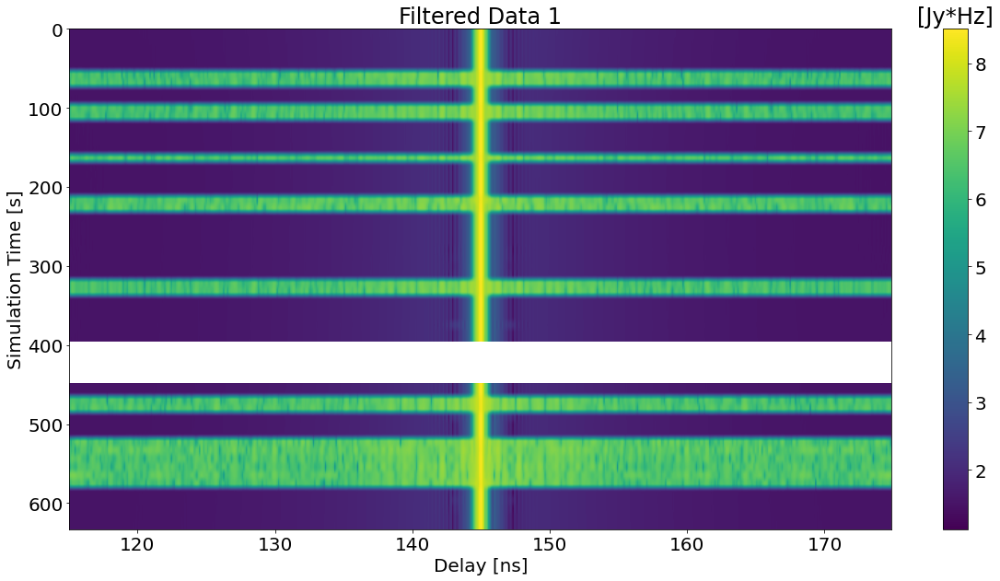

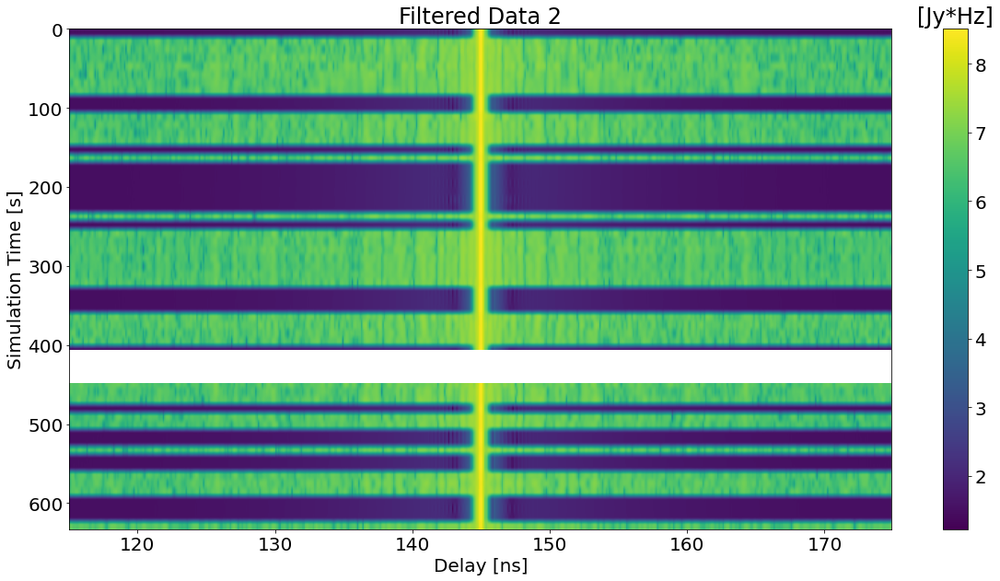

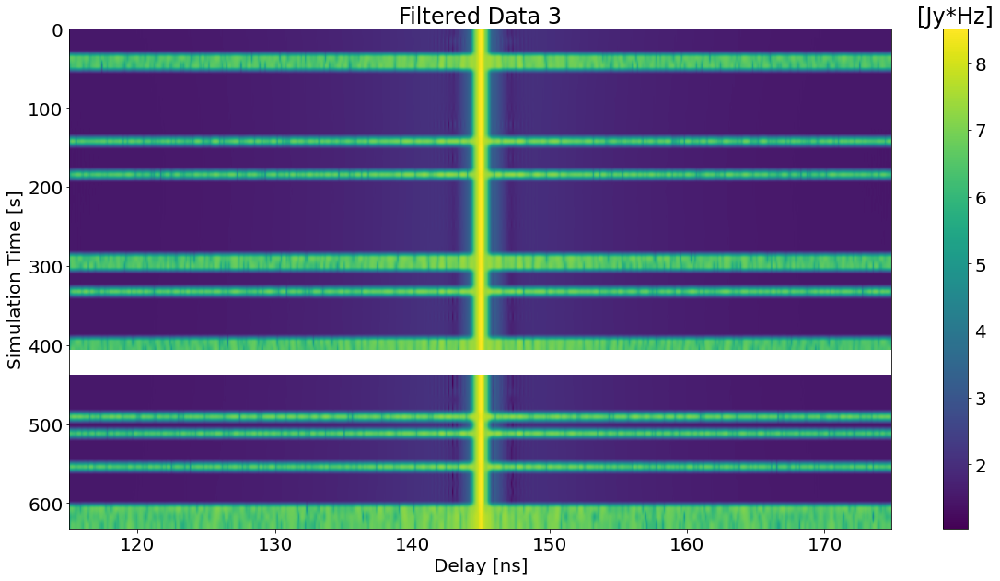

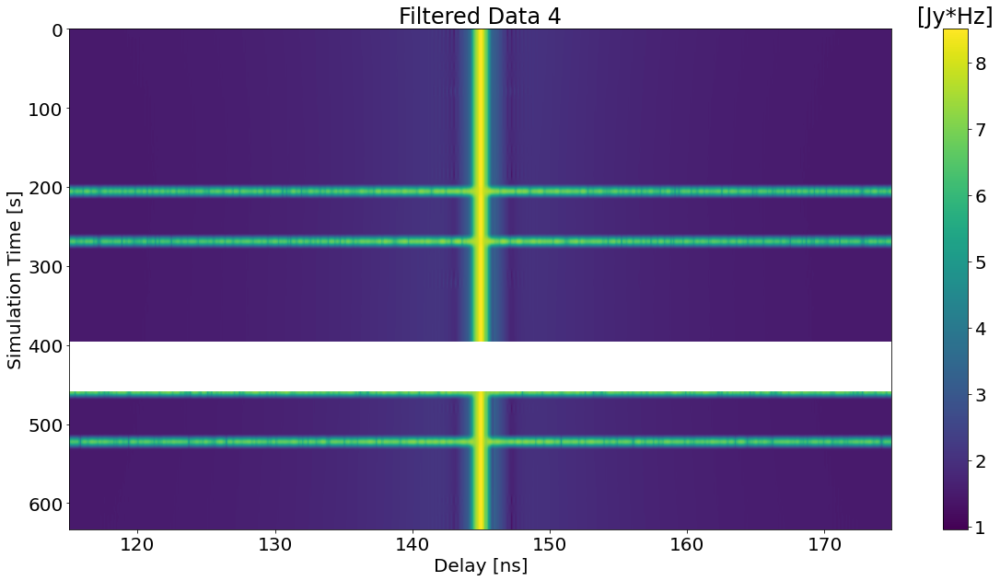

...

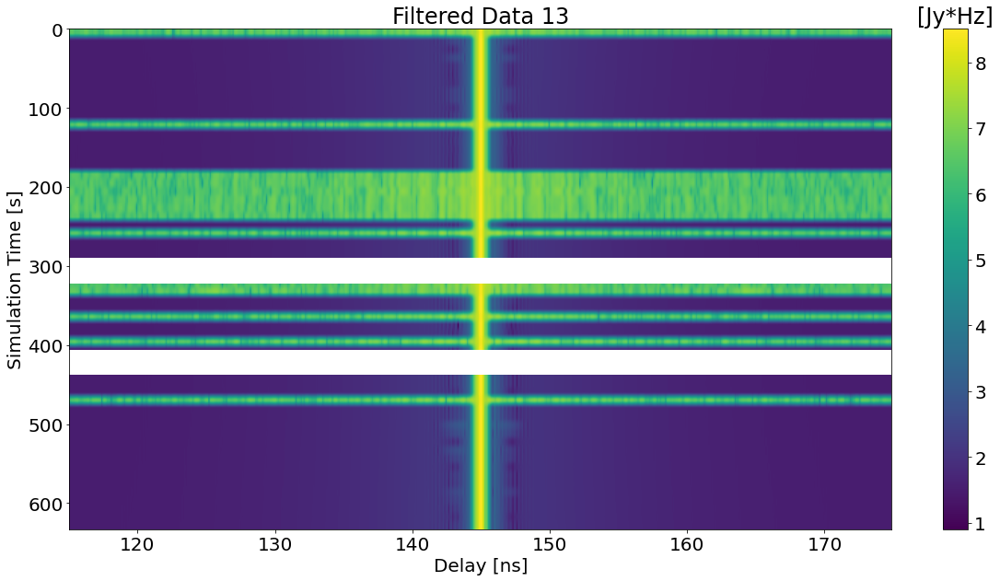

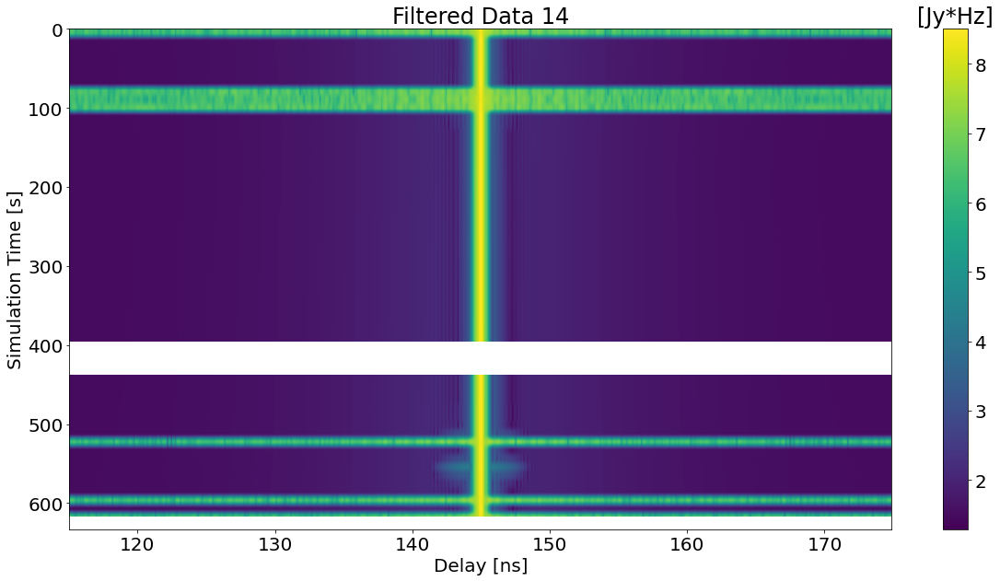

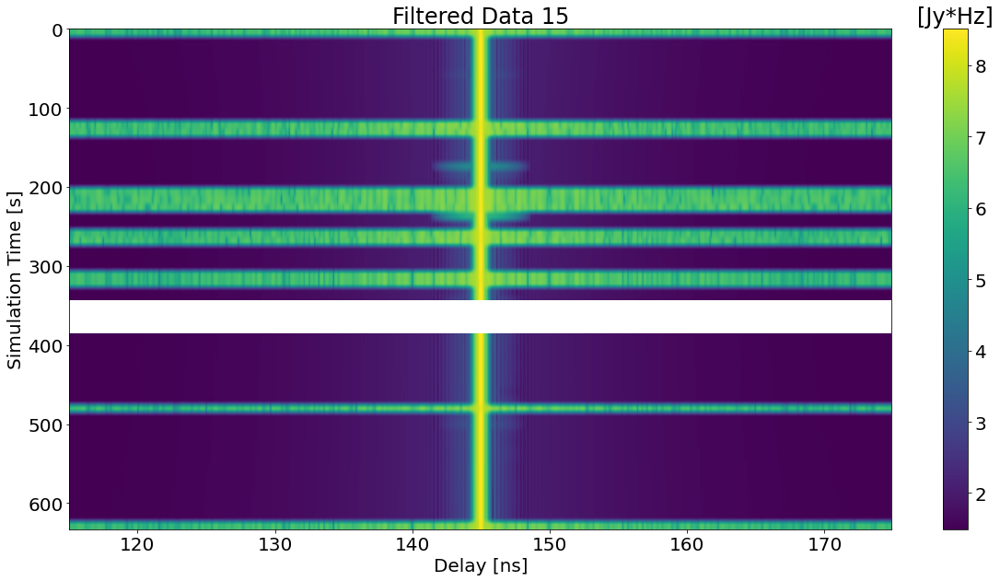

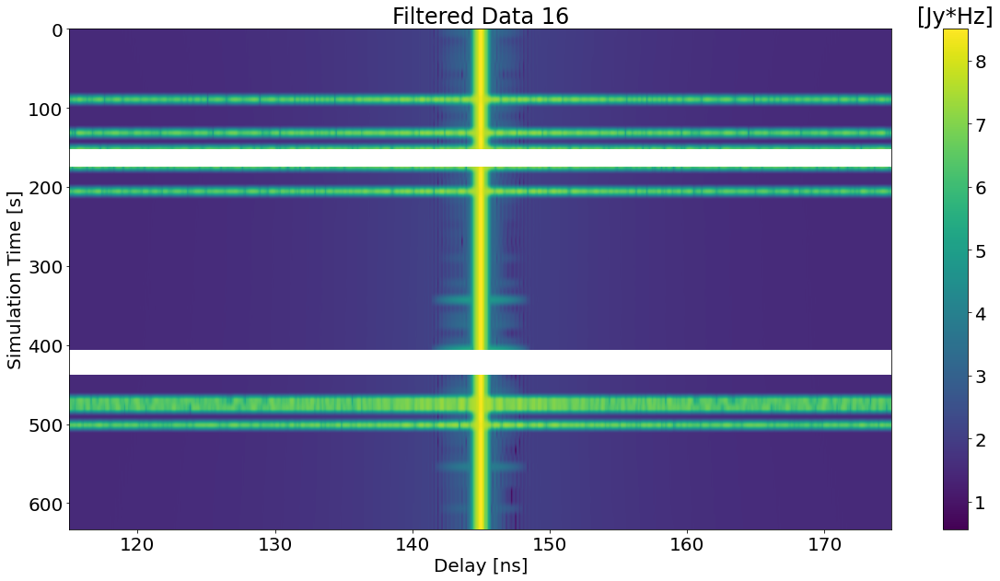

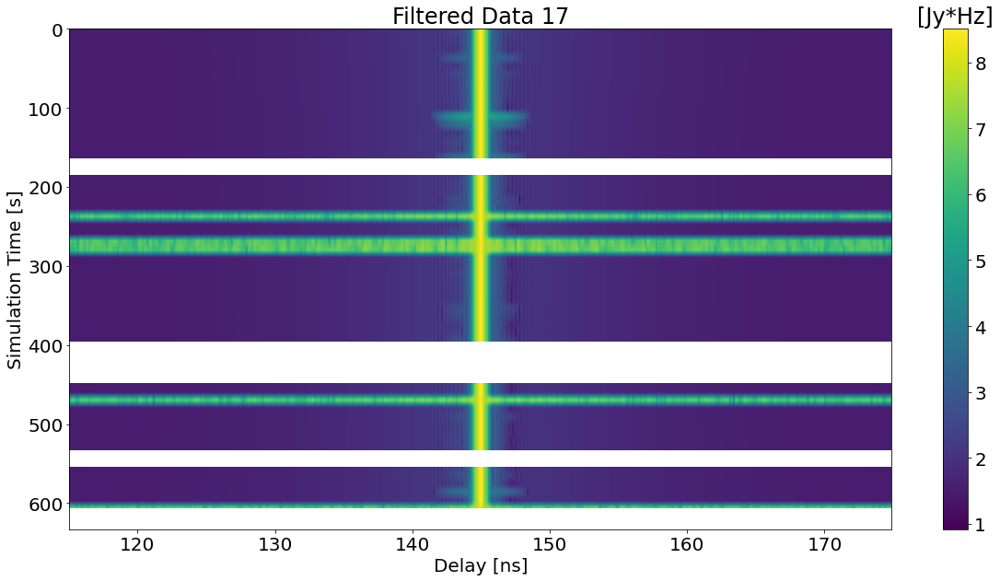

In [92]:
for day in range(0,18):
    hd = HERAData(f"/users/kshahin/kshahin/HERA_Calibration/Day_{day}/data_{day}_0_filtered.uvh5")
    data, flags, nsamples = hd.read()
    plt.figure()
    plt.imshow(np.log10(np.abs(fft(data[(0, 1, 'ee')]*(data.freqs[1]-data.freqs[0])))), extent=ext2, aspect='auto')
    clb = plt.colorbar()
    clb.ax.set_title('[Jy*Hz]')
    plt.xlabel('Delay [ns]')
    plt.ylabel('Simulation Time [s]')
    plt.title(f'Filtered Data {day}')

Telescope hera_sim is not in known_telescopes.
divide by zero encountered in log10
divide by zero encountered in log10
divide by zero encountered in log10


Text(0.5, 1.0, 'ABF   (Long BL)')

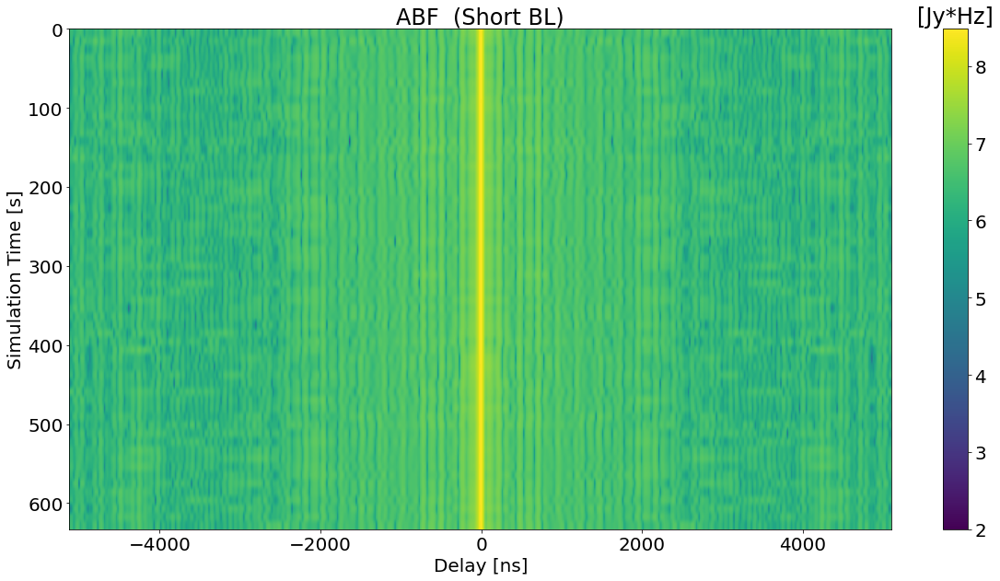

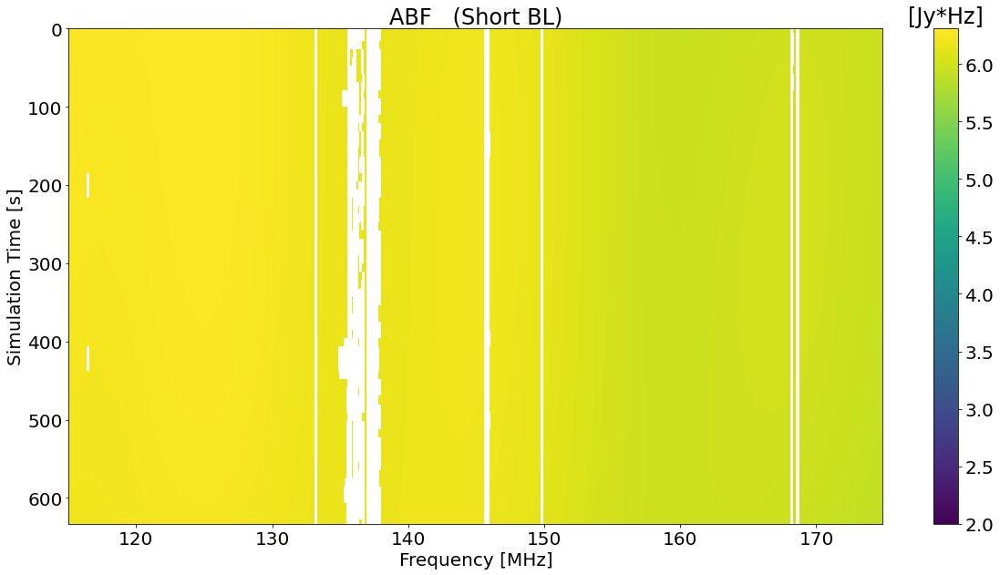

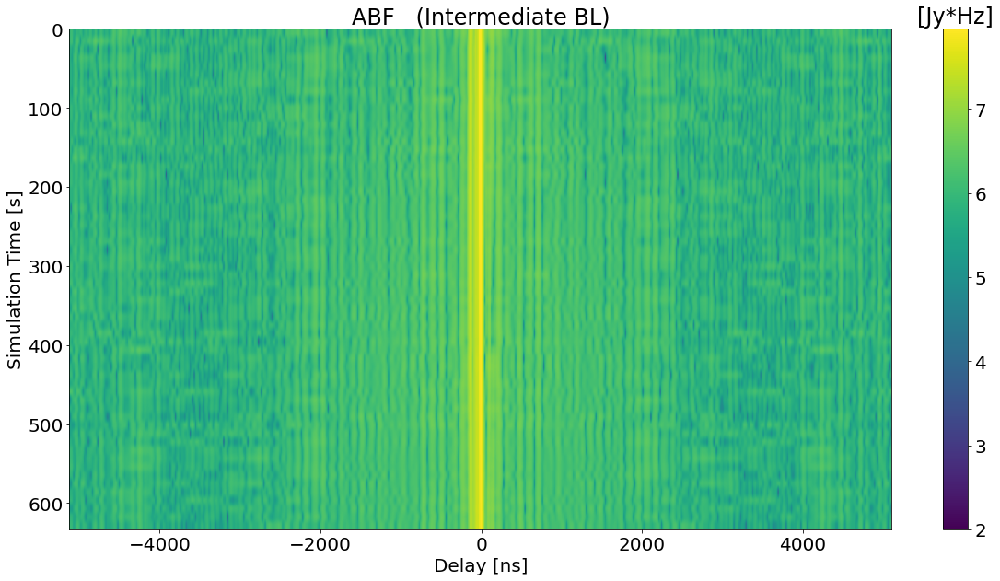

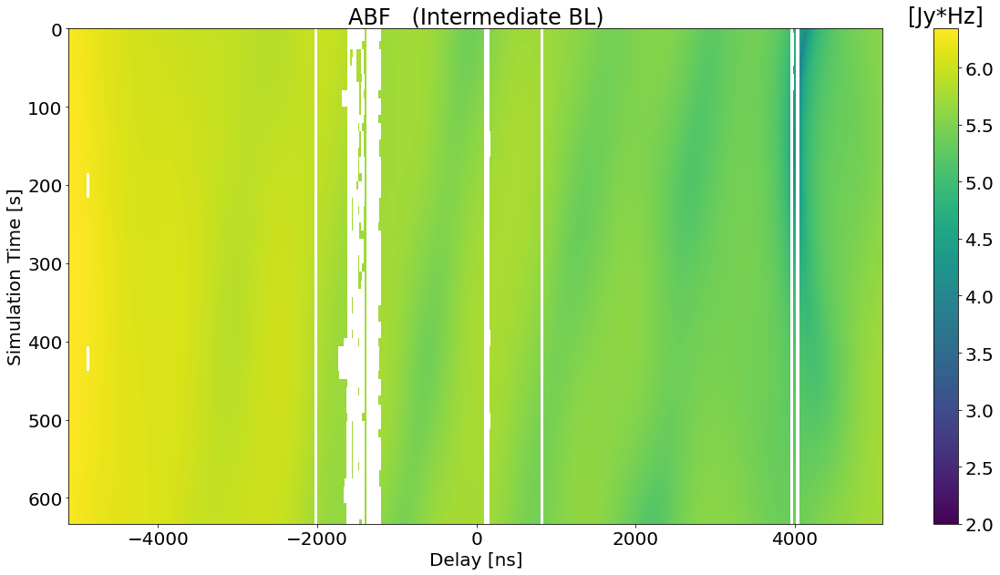

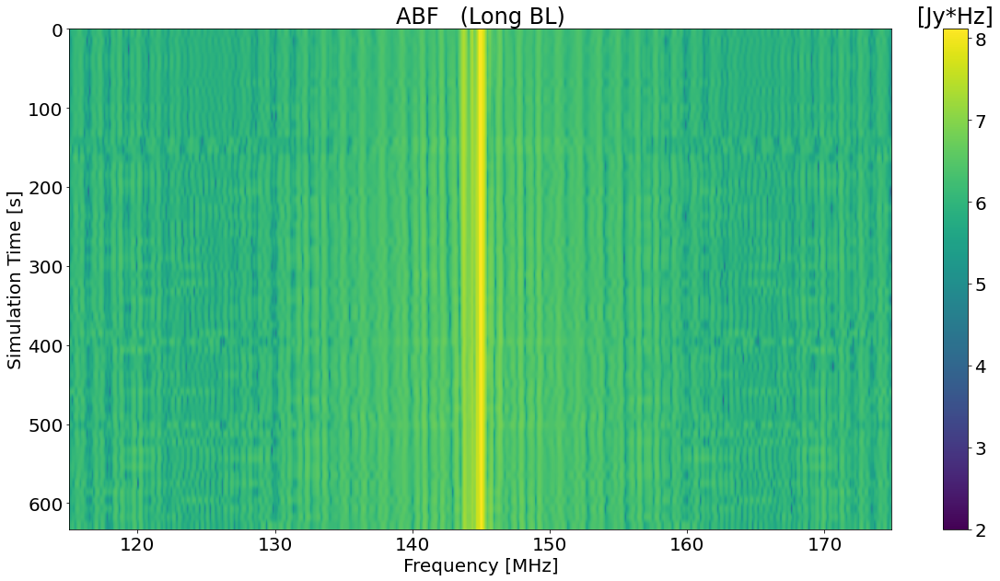

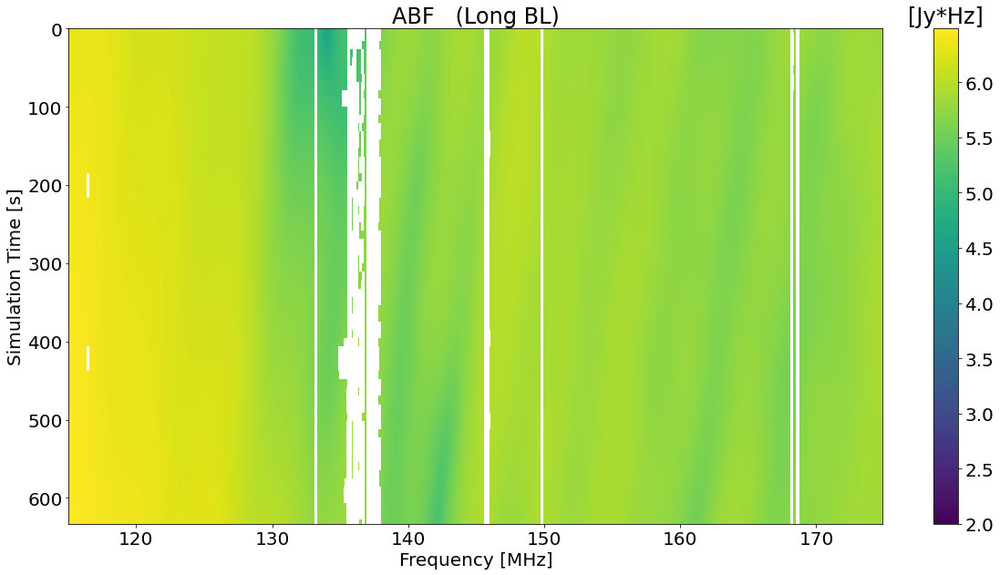

In [99]:
hd = HERAData("AverageBeforeFilter_NonRedun/data_avg_0.uvh5")
data, flags, nsamples = hd.read()
plt.figure()
plt.imshow(np.log10(np.abs(fft((data[(0, 1, 'ee')]*(data.freqs[1]-data.freqs[0]))))), extent=ext, aspect='auto', vmin=2)
clb = plt.colorbar()
clb.ax.set_title('[Jy*Hz]')
plt.xlabel('Delay [ns]')
plt.ylabel('Simulation Time [s]')
plt.title('ABF  (Short BL)')
plt.figure()
plt.imshow(np.log10(np.abs(data[(0, 1, 'ee')]*(data.freqs[1]-data.freqs[0]))), extent=ext2, aspect='auto', vmin=2)
clb = plt.colorbar()
clb.ax.set_title('[Jy*Hz]')
plt.xlabel('Frequency [MHz]')
plt.ylabel('Simulation Time [s]')
plt.title('ABF   (Short BL)')
plt.figure()
plt.imshow(np.log10(np.abs(fft((data[(11, 14, 'ee')]*(data.freqs[1]-data.freqs[0]))))), extent=ext, aspect='auto', vmin=2)
clb = plt.colorbar()
clb.ax.set_title('[Jy*Hz]')
plt.xlabel('Delay [ns]')
plt.ylabel('Simulation Time [s]')
plt.title('ABF   (Intermediate BL)')
plt.figure()
plt.imshow(np.log10(np.abs((data[(11, 14, 'ee')]*(data.freqs[1]-data.freqs[0])))), extent=ext, aspect='auto', vmin=2)
clb = plt.colorbar()
clb.ax.set_title('[Jy*Hz]')
plt.xlabel('Delay [ns]')
plt.ylabel('Simulation Time [s]')
plt.title('ABF   (Intermediate BL)')
plt.figure()
plt.imshow(np.log10(np.abs(fft(data[(36, 41, 'ee')]*(data.freqs[1]-data.freqs[0])))), extent=ext2, aspect='auto', vmin=2)
clb = plt.colorbar()
clb.ax.set_title('[Jy*Hz]')
plt.xlabel('Frequency [MHz]')
plt.ylabel('Simulation Time [s]')
plt.title('ABF   (Long BL)')
plt.figure()
plt.imshow(np.log10(np.abs(data[(36, 41, 'ee')]*(data.freqs[1]-data.freqs[0]))), extent=ext2, aspect='auto', vmin=2)
clb = plt.colorbar()
clb.ax.set_title('[Jy*Hz]')
plt.xlabel('Frequency [MHz]')
plt.ylabel('Simulation Time [s]')
plt.title('ABF   (Long BL)')

Telescope hera_sim is not in known_telescopes.


Text(0.5, 1.0, 'ABF  Filtered (Long BL)')

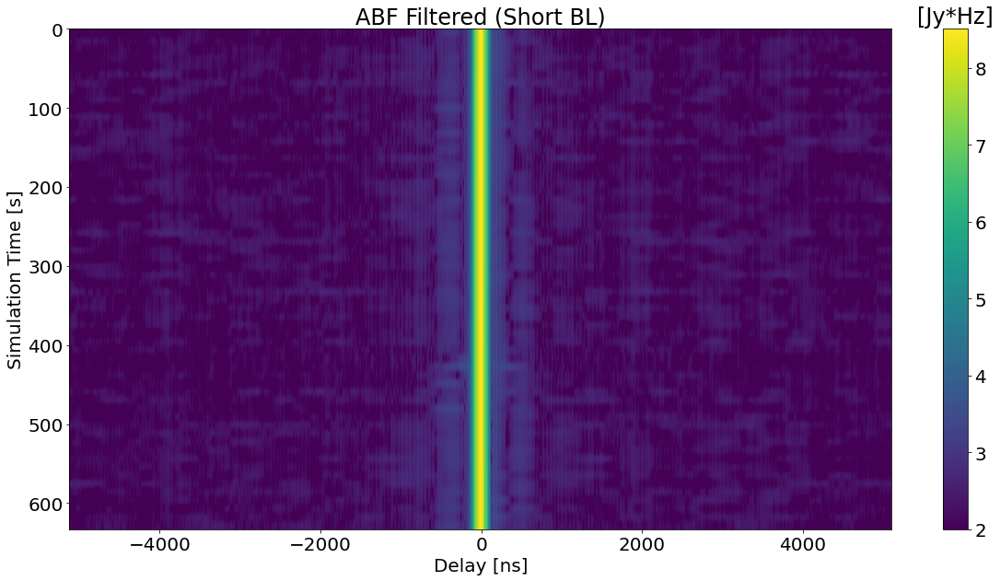

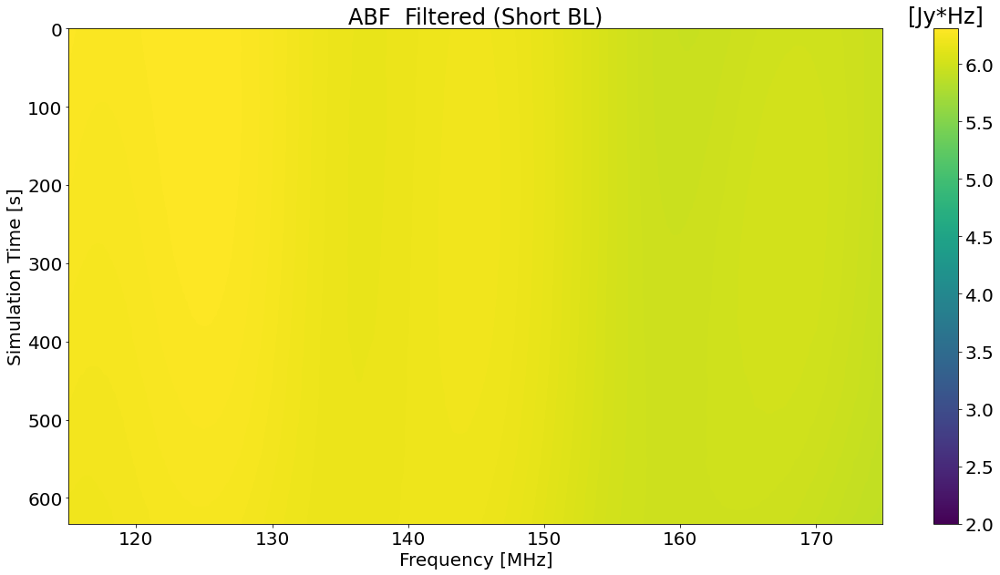

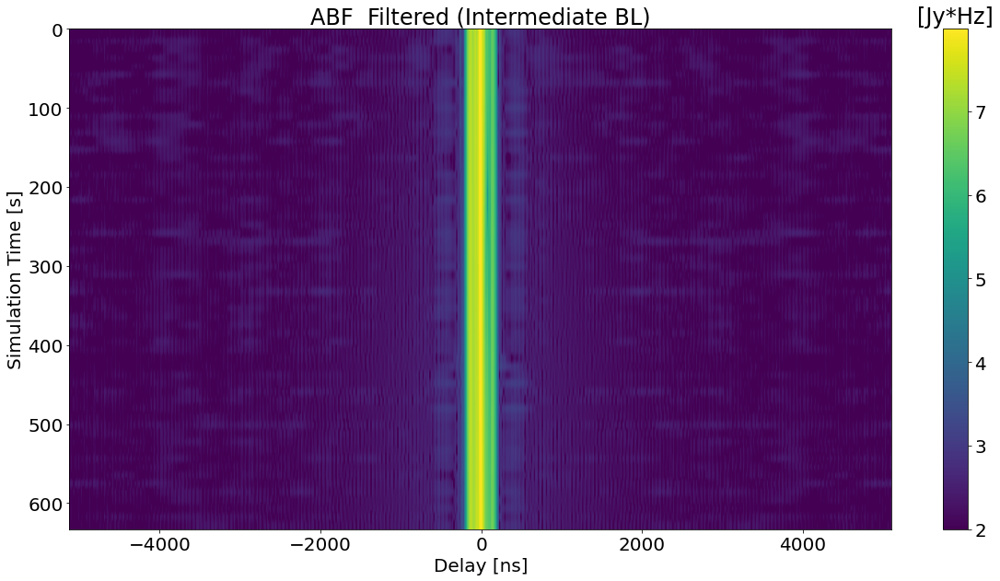

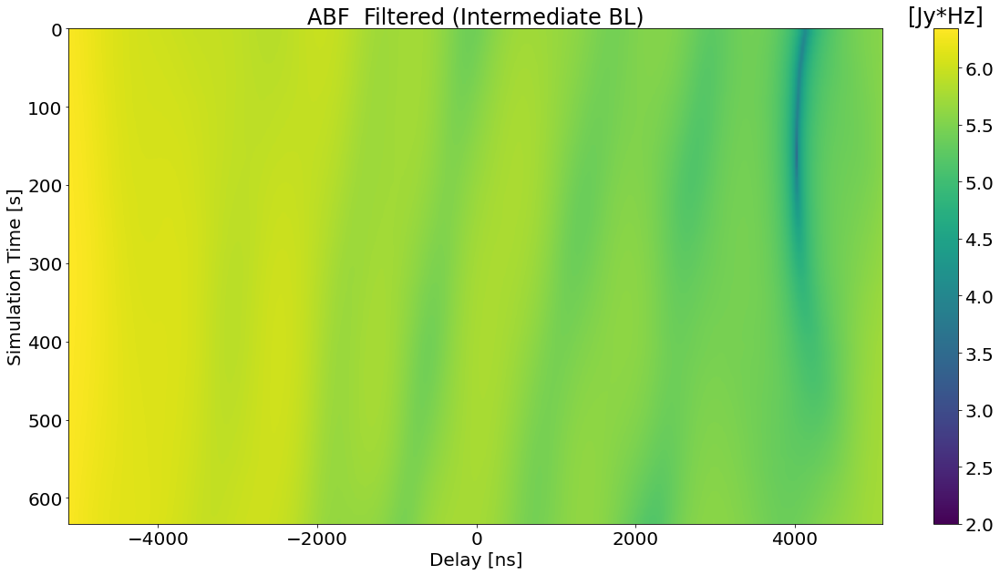

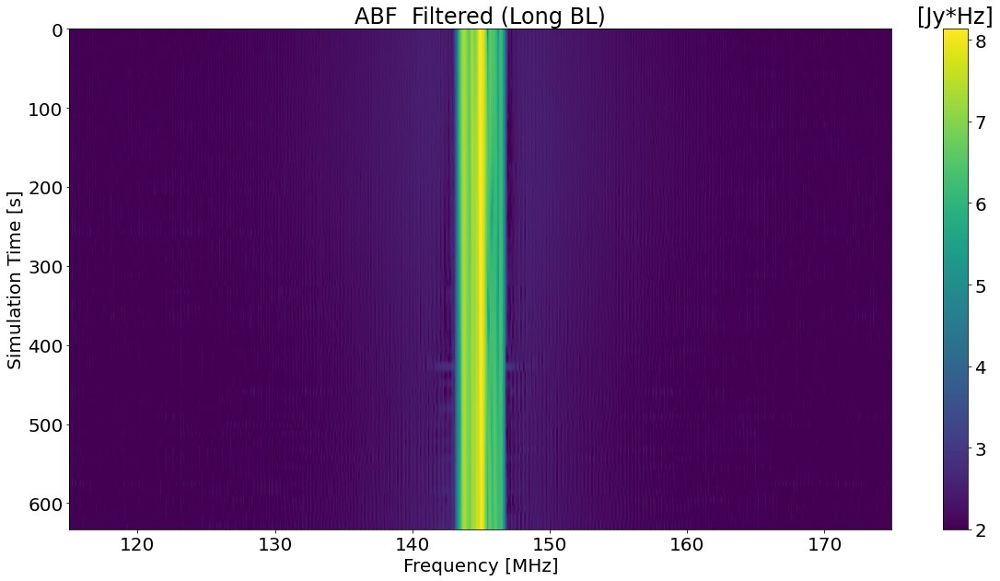

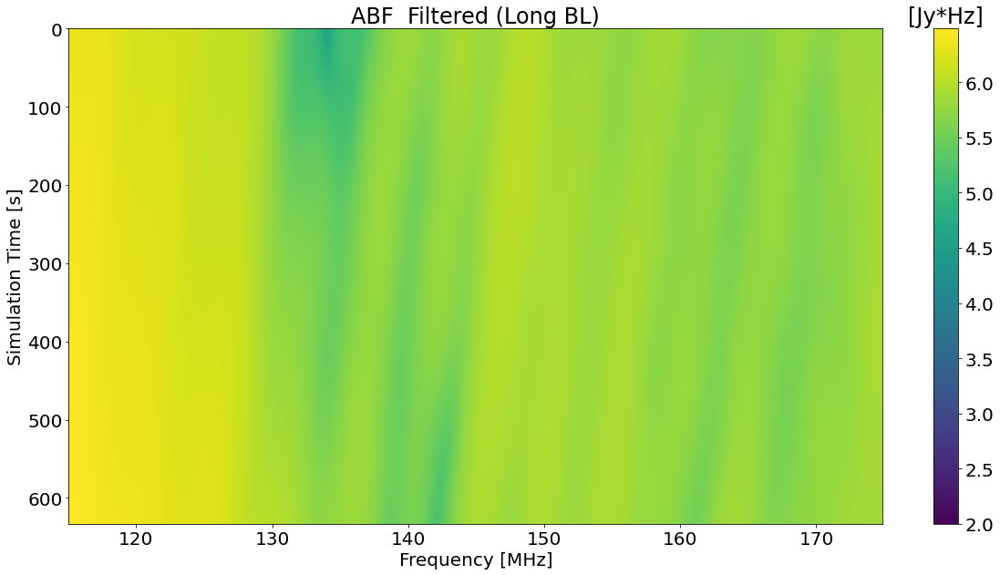

In [97]:
hd = HERAData("AverageBeforeFilter_NonRedun/data_avg_0_filtered.uvh5")
data, flags, nsamples = hd.read()
plt.figure()
plt.imshow(np.log10(np.abs(fft((data[(0, 1, 'ee')]*(data.freqs[1]-data.freqs[0]))))), extent=ext, aspect='auto', vmin=2)
clb = plt.colorbar()
clb.ax.set_title('[Jy*Hz]')
plt.xlabel('Delay [ns]')
plt.ylabel('Simulation Time [s]')
plt.title('ABF Filtered (Short BL)')
plt.figure()
plt.imshow(np.log10(np.abs(data[(0, 1, 'ee')]*(data.freqs[1]-data.freqs[0]))), extent=ext2, aspect='auto', vmin=2)
clb = plt.colorbar()
clb.ax.set_title('[Jy*Hz]')
plt.xlabel('Frequency [MHz]')
plt.ylabel('Simulation Time [s]')
plt.title('ABF  Filtered (Short BL)')
plt.figure()
plt.imshow(np.log10(np.abs(fft((data[(11, 14, 'ee')]*(data.freqs[1]-data.freqs[0]))))), extent=ext, aspect='auto', vmin=2)
clb = plt.colorbar()
clb.ax.set_title('[Jy*Hz]')
plt.xlabel('Delay [ns]')
plt.ylabel('Simulation Time [s]')
plt.title('ABF  Filtered (Intermediate BL)')
plt.figure()
plt.imshow(np.log10(np.abs((data[(11, 14, 'ee')]*(data.freqs[1]-data.freqs[0])))), extent=ext, aspect='auto', vmin=2)
clb = plt.colorbar()
clb.ax.set_title('[Jy*Hz]')
plt.xlabel('Delay [ns]')
plt.ylabel('Simulation Time [s]')
plt.title('ABF  Filtered (Intermediate BL)')
plt.figure()
plt.imshow(np.log10(np.abs(fft(data[(36, 41, 'ee')]*(data.freqs[1]-data.freqs[0])))), extent=ext2, aspect='auto', vmin=2)
clb = plt.colorbar()
clb.ax.set_title('[Jy*Hz]')
plt.xlabel('Frequency [MHz]')
plt.ylabel('Simulation Time [s]')
plt.title('ABF  Filtered (Long BL)')
plt.figure()
plt.imshow(np.log10(np.abs(data[(36, 41, 'ee')]*(data.freqs[1]-data.freqs[0]))), extent=ext2, aspect='auto', vmin=2)
clb = plt.colorbar()
clb.ax.set_title('[Jy*Hz]')
plt.xlabel('Frequency [MHz]')
plt.ylabel('Simulation Time [s]')
plt.title('ABF  Filtered (Long BL)')

Telescope hera_sim is not in known_telescopes.


Text(0.5, 1.0, 'AAF  Filtered (Long BL)')

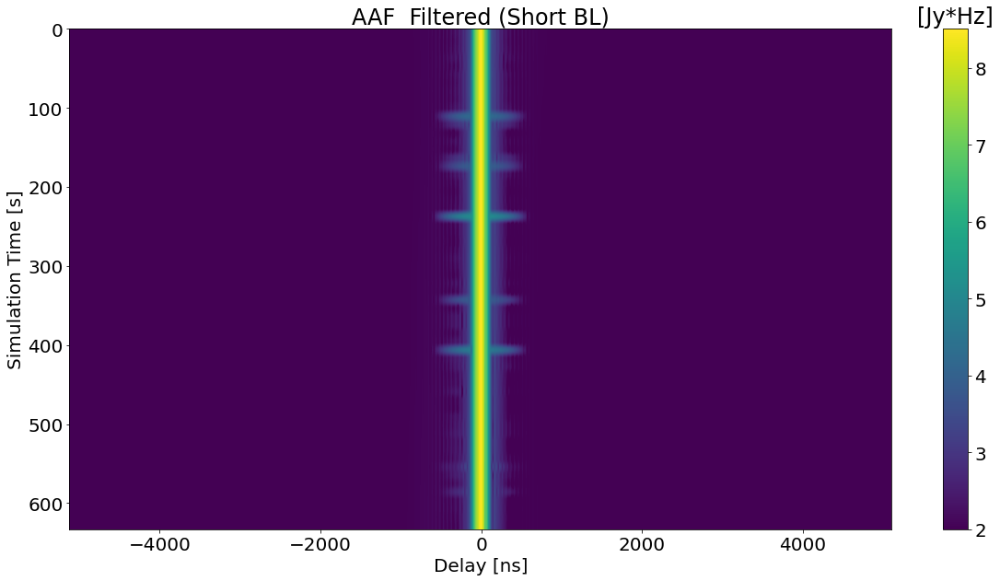

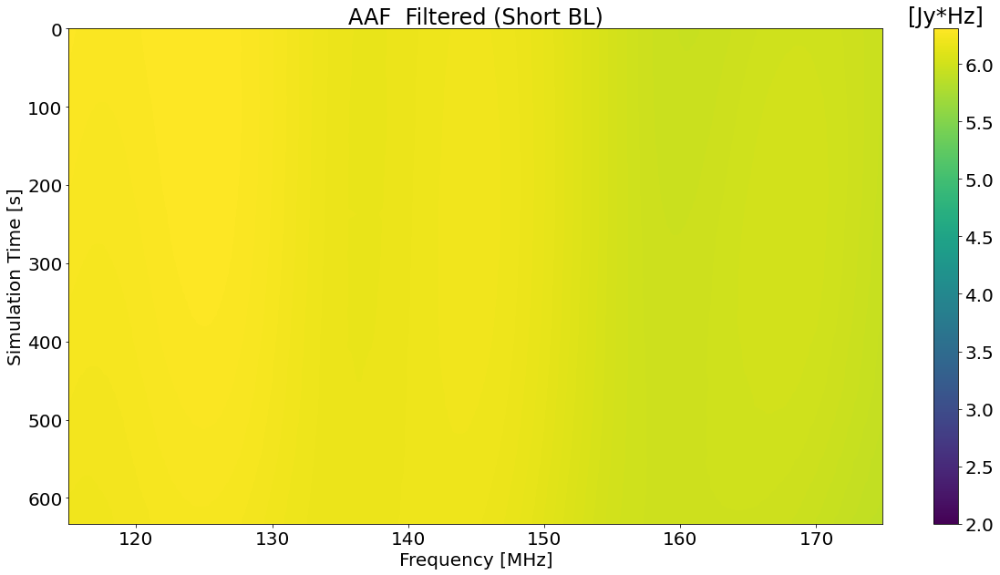

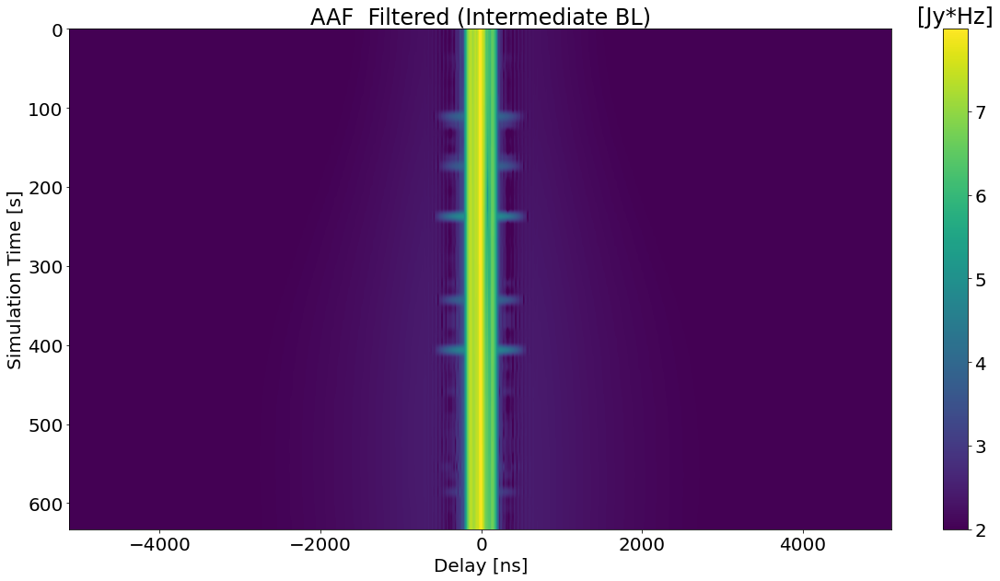

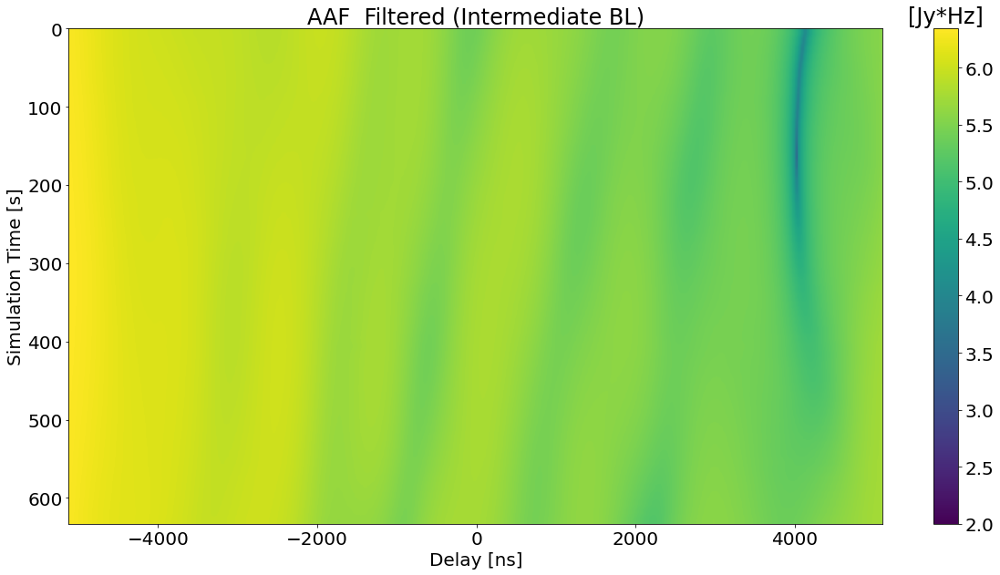

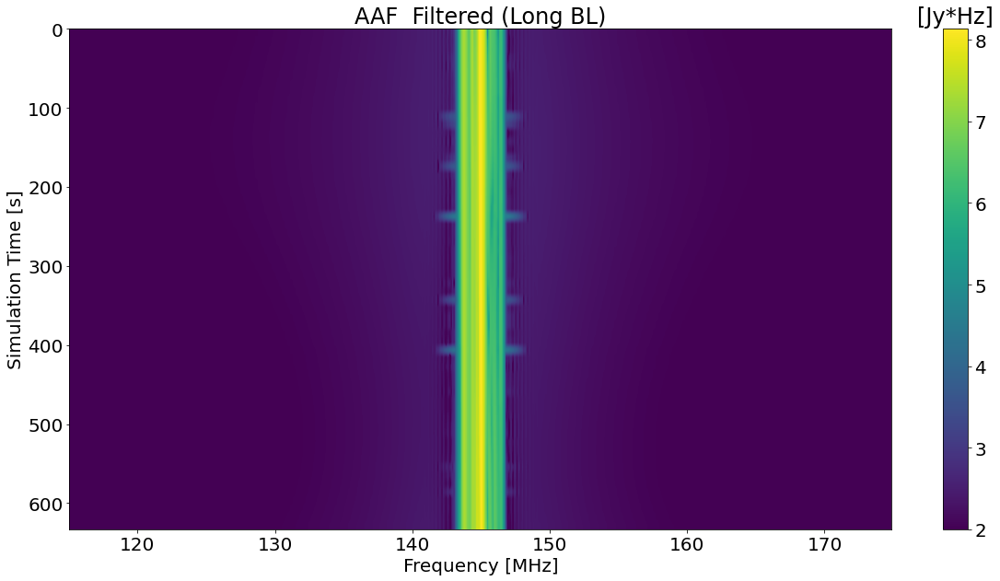

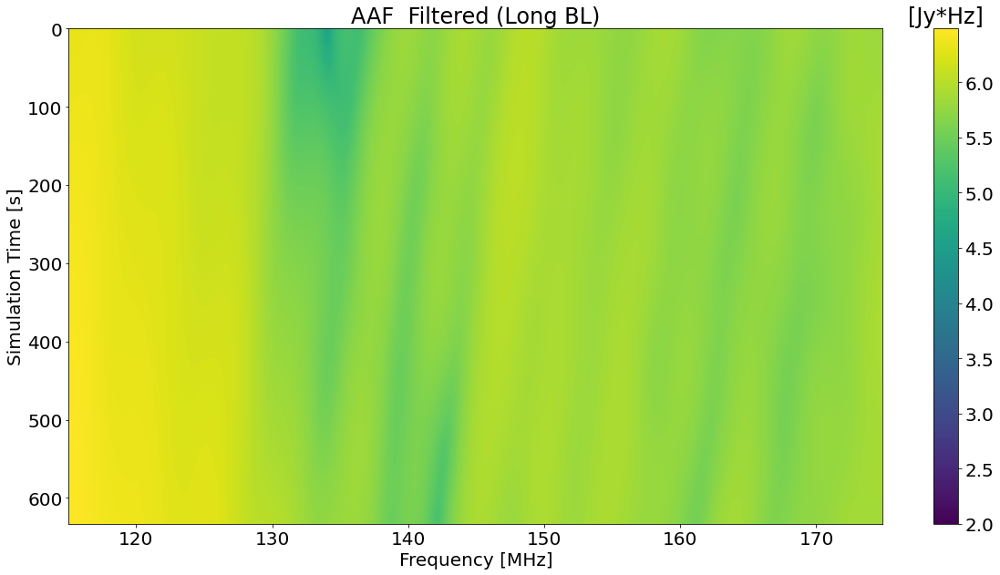

In [98]:
hd = HERAData("AverageAfterFilter_NonRedun/data_avg_0_filtered.uvh5")
data, flags, nsamples = hd.read()
plt.figure()
plt.imshow(np.log10(np.abs(fft((data[(0, 1, 'ee')]*(data.freqs[1]-data.freqs[0]))))), extent=ext, aspect='auto', vmin=2)
clb = plt.colorbar()
clb.ax.set_title('[Jy*Hz]')
plt.xlabel('Delay [ns]')
plt.ylabel('Simulation Time [s]')
plt.title('AAF  Filtered (Short BL)')
plt.figure()
plt.imshow(np.log10(np.abs(data[(0, 1, 'ee')]*(data.freqs[1]-data.freqs[0]))), extent=ext2, aspect='auto', vmin=2)
clb = plt.colorbar()
clb.ax.set_title('[Jy*Hz]')
plt.xlabel('Frequency [MHz]')
plt.ylabel('Simulation Time [s]')
plt.title('AAF  Filtered (Short BL)')
plt.figure()
plt.imshow(np.log10(np.abs(fft((data[(11, 14, 'ee')]*(data.freqs[1]-data.freqs[0]))))), extent=ext, aspect='auto', vmin=2)
clb = plt.colorbar()
clb.ax.set_title('[Jy*Hz]')
plt.xlabel('Delay [ns]')
plt.ylabel('Simulation Time [s]')
plt.title('AAF  Filtered (Intermediate BL)')
plt.figure()
plt.imshow(np.log10(np.abs((data[(11, 14, 'ee')]*(data.freqs[1]-data.freqs[0])))), extent=ext, aspect='auto', vmin=2)
clb = plt.colorbar()
clb.ax.set_title('[Jy*Hz]')
plt.xlabel('Delay [ns]')
plt.ylabel('Simulation Time [s]')
plt.title('AAF  Filtered (Intermediate BL)')
plt.figure()
plt.imshow(np.log10(np.abs(fft(data[(36, 41, 'ee')]*(data.freqs[1]-data.freqs[0])))), extent=ext2, aspect='auto', vmin=2)
clb = plt.colorbar()
clb.ax.set_title('[Jy*Hz]')
plt.xlabel('Frequency [MHz]')
plt.ylabel('Simulation Time [s]')
plt.title('AAF  Filtered (Long BL)')
plt.figure()
plt.imshow(np.log10(np.abs(data[(36, 41, 'ee')]*(data.freqs[1]-data.freqs[0]))), extent=ext2, aspect='auto', vmin=2)
clb = plt.colorbar()
clb.ax.set_title('[Jy*Hz]')
plt.xlabel('Frequency [MHz]')
plt.ylabel('Simulation Time [s]')
plt.title('AAF  Filtered (Long BL)')

Telescope hera_sim is not in known_telescopes.


Text(0.5, 1.0, 'ABF  Filtered Average (Long BL)')

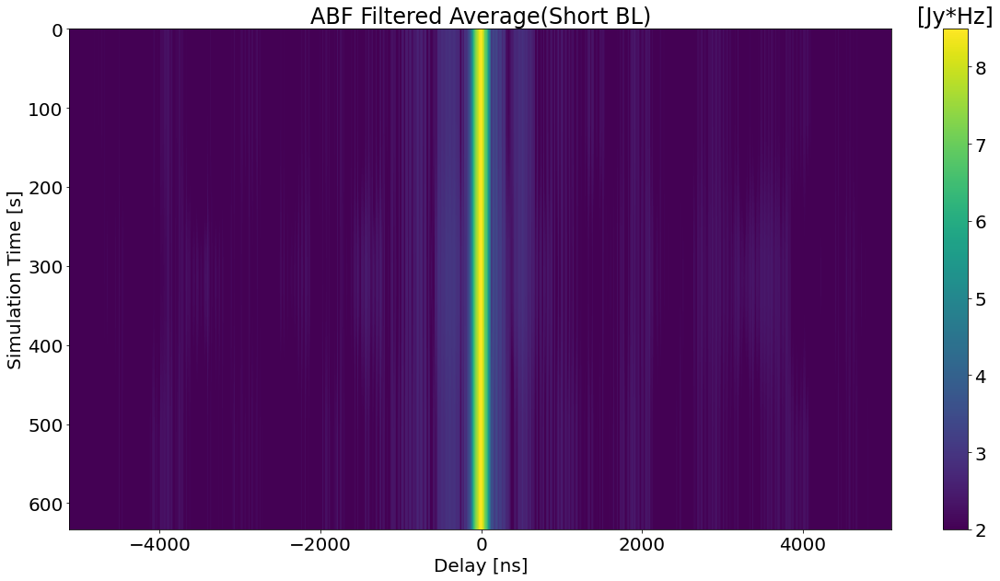

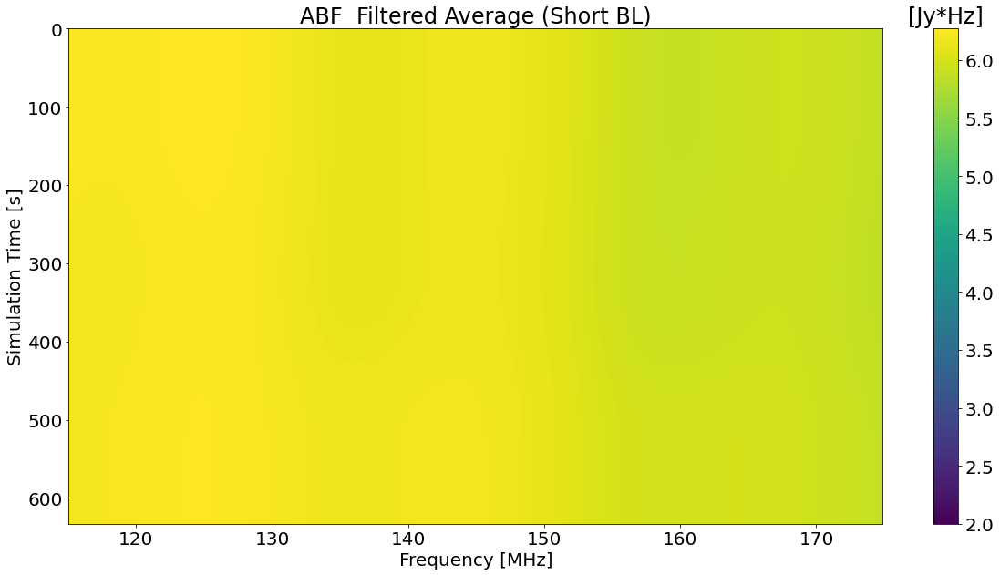

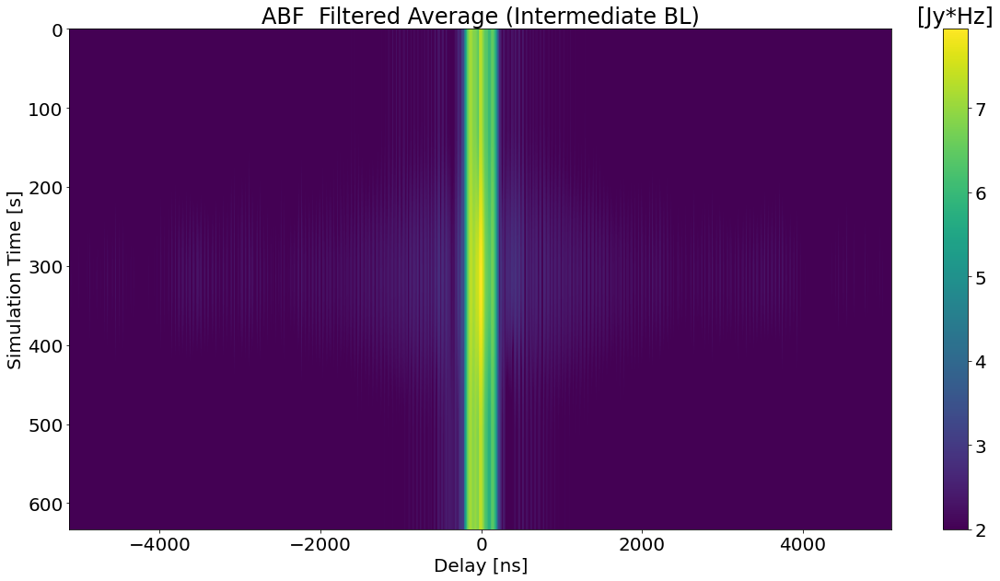

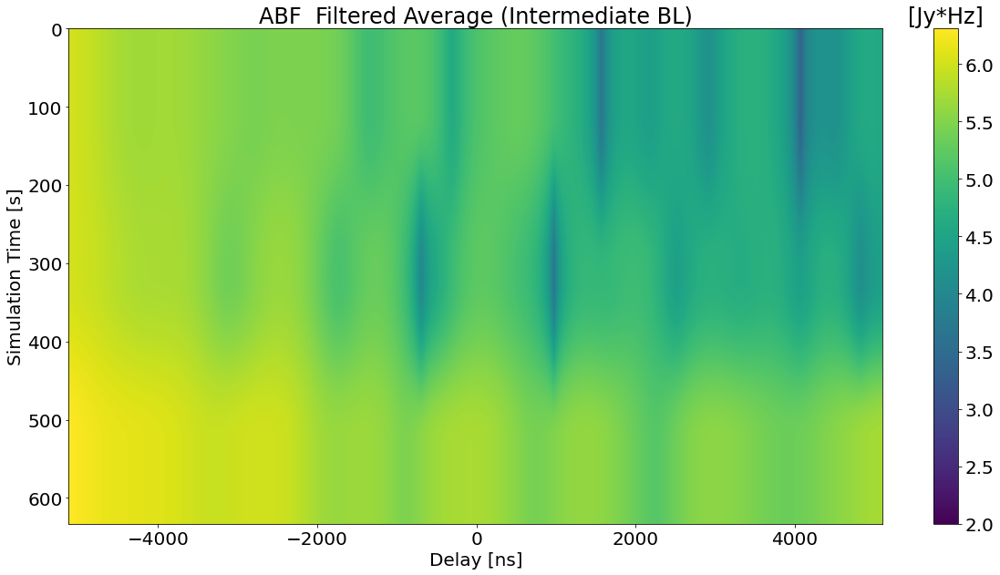

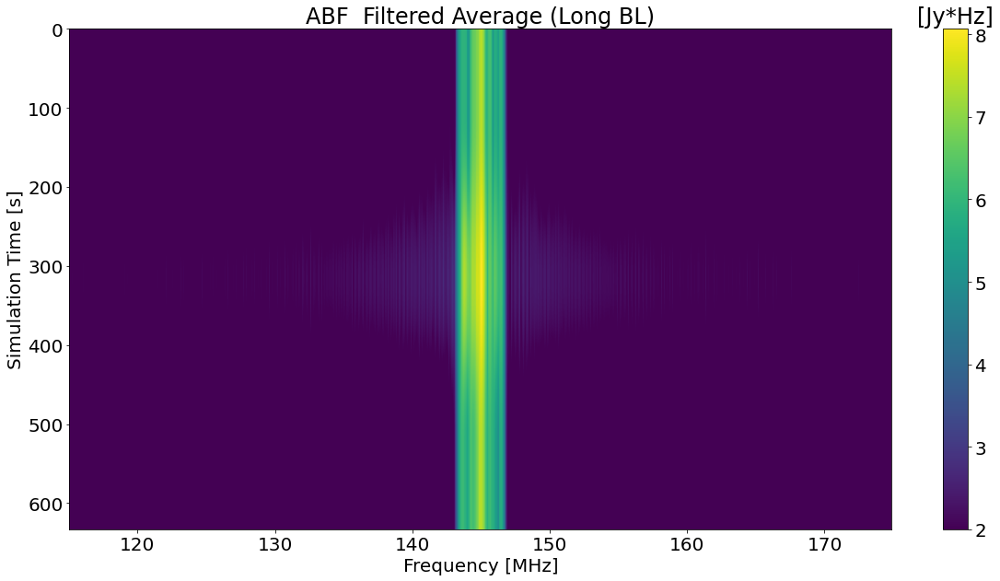

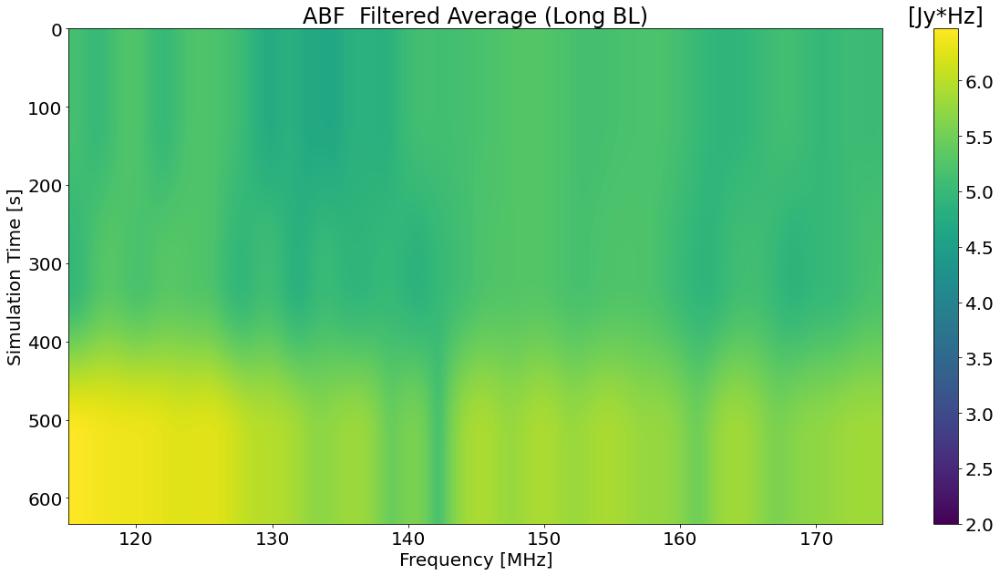

In [101]:
hd = HERAData("AverageBeforeFilter_NonRedun/data_avg.Cavg.uvh5")
data, flags, nsamples = hd.read()
plt.figure()
plt.imshow(np.log10(np.abs(fft((data[(0, 1, 'ee')]*(data.freqs[1]-data.freqs[0]))))), extent=ext, aspect='auto', vmin=2)
clb = plt.colorbar()
clb.ax.set_title('[Jy*Hz]')
plt.xlabel('Delay [ns]')
plt.ylabel('Simulation Time [s]')
plt.title('ABF Filtered Average(Short BL)')
plt.figure()
plt.imshow(np.log10(np.abs(data[(0, 1, 'ee')]*(data.freqs[1]-data.freqs[0]))), extent=ext2, aspect='auto', vmin=2)
clb = plt.colorbar()
clb.ax.set_title('[Jy*Hz]')
plt.xlabel('Frequency [MHz]')
plt.ylabel('Simulation Time [s]')
plt.title('ABF  Filtered Average (Short BL)')
plt.figure()
plt.imshow(np.log10(np.abs(fft((data[(11, 14, 'ee')]*(data.freqs[1]-data.freqs[0]))))), extent=ext, aspect='auto', vmin=2)
clb = plt.colorbar()
clb.ax.set_title('[Jy*Hz]')
plt.xlabel('Delay [ns]')
plt.ylabel('Simulation Time [s]')
plt.title('ABF  Filtered Average (Intermediate BL)')
plt.figure()
plt.imshow(np.log10(np.abs((data[(11, 14, 'ee')]*(data.freqs[1]-data.freqs[0])))), extent=ext, aspect='auto', vmin=2)
clb = plt.colorbar()
clb.ax.set_title('[Jy*Hz]')
plt.xlabel('Delay [ns]')
plt.ylabel('Simulation Time [s]')
plt.title('ABF  Filtered Average (Intermediate BL)')
plt.figure()
plt.imshow(np.log10(np.abs(fft(data[(36, 41, 'ee')]*(data.freqs[1]-data.freqs[0])))), extent=ext2, aspect='auto', vmin=2)
clb = plt.colorbar()
clb.ax.set_title('[Jy*Hz]')
plt.xlabel('Frequency [MHz]')
plt.ylabel('Simulation Time [s]')
plt.title('ABF  Filtered Average (Long BL)')
plt.figure()
plt.imshow(np.log10(np.abs(data[(36, 41, 'ee')]*(data.freqs[1]-data.freqs[0]))), extent=ext2, aspect='auto', vmin=2)
clb = plt.colorbar()
clb.ax.set_title('[Jy*Hz]')
plt.xlabel('Frequency [MHz]')
plt.ylabel('Simulation Time [s]')
plt.title('ABF  Filtered Average (Long BL)')

Telescope hera_sim is not in known_telescopes.


Text(0.5, 1.0, 'AAF  Filtered Average (Long BL)')

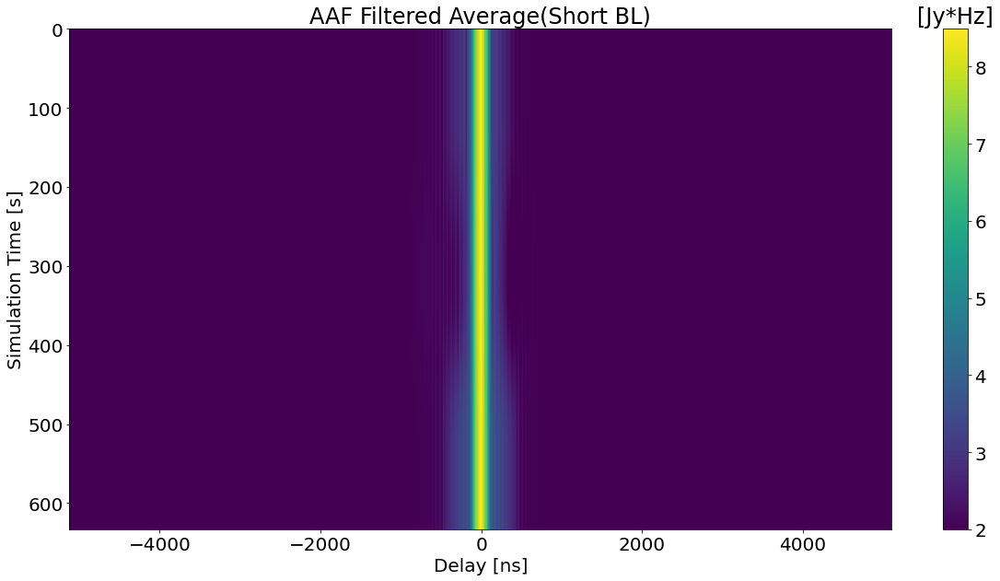

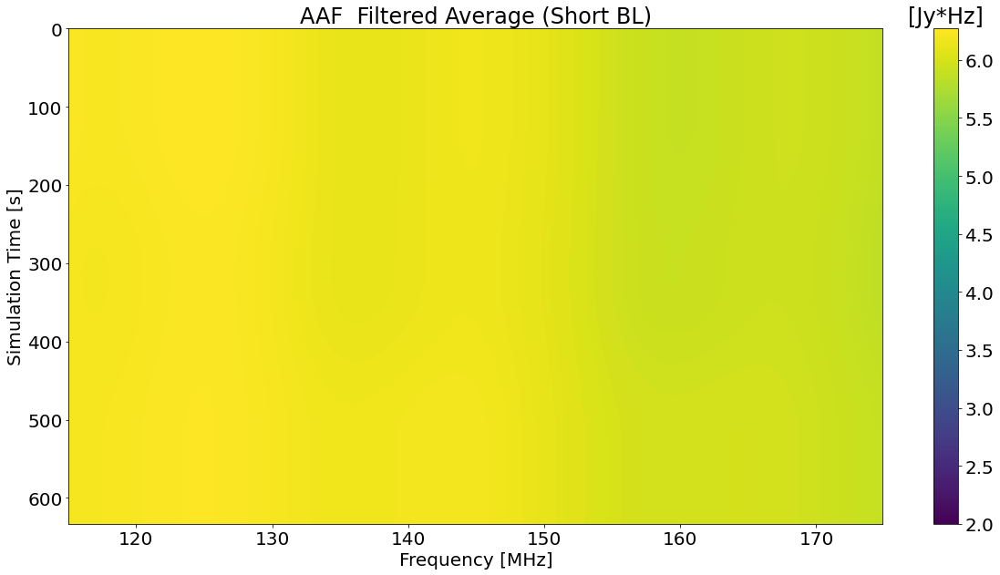

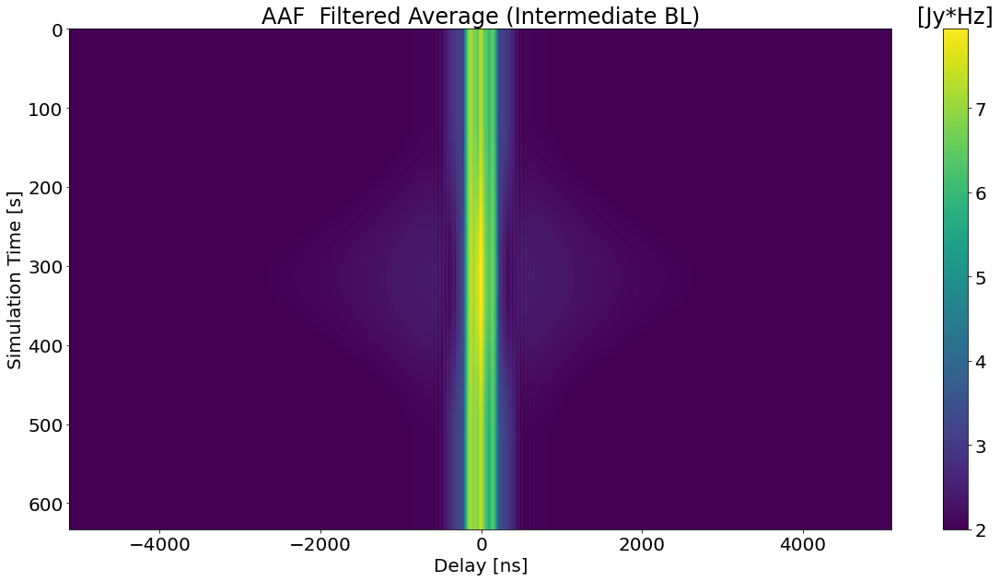

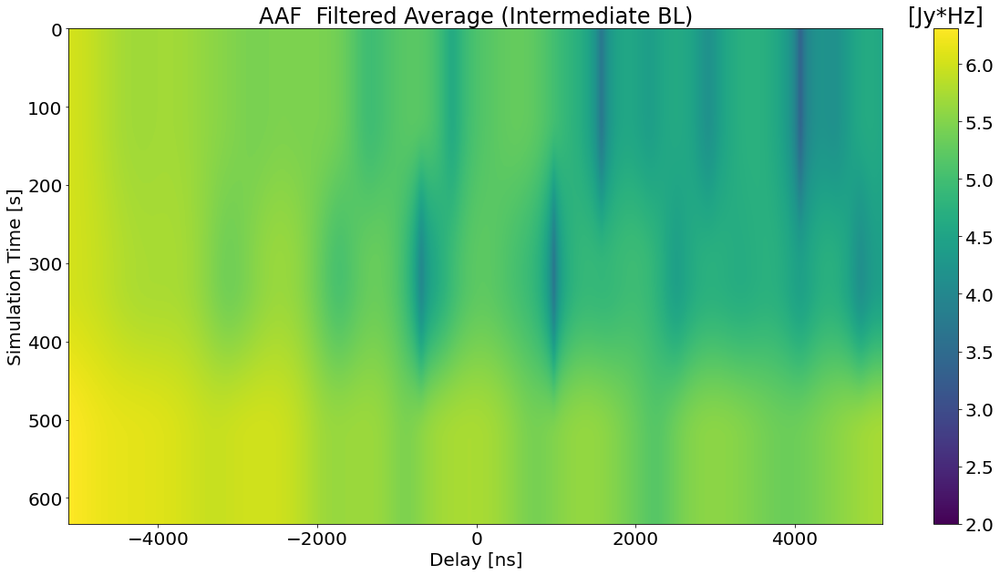

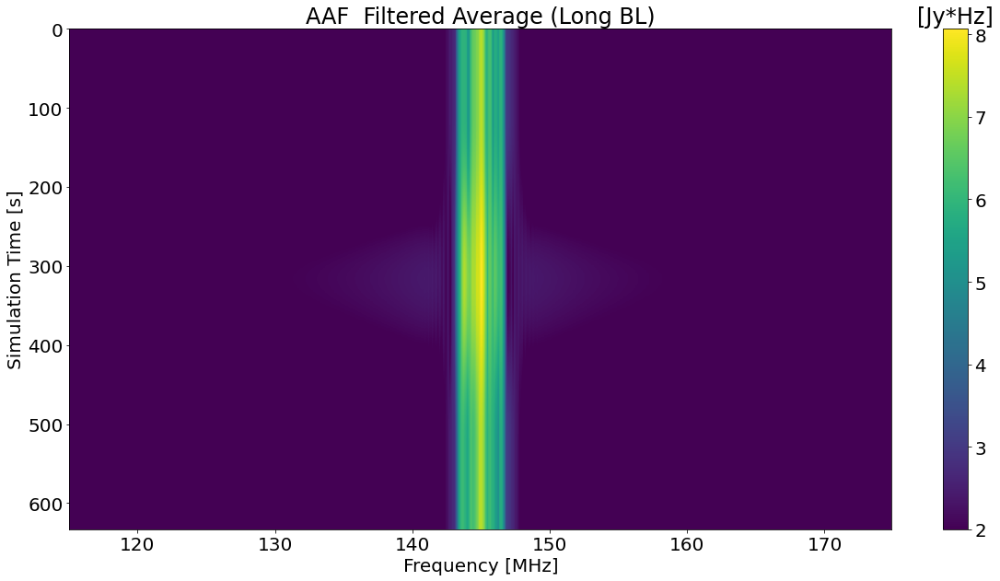

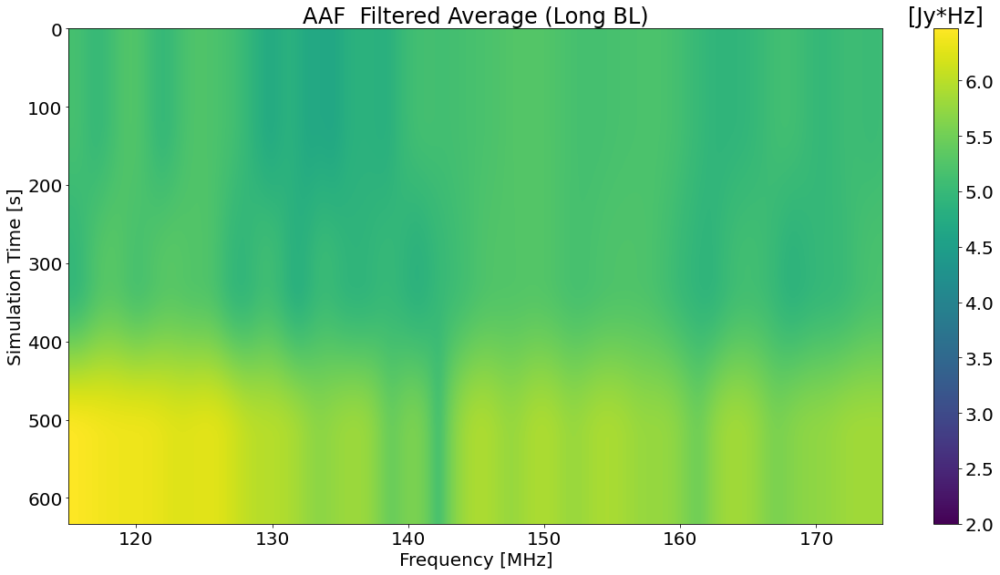

In [102]:
hd = HERAData("AverageAfterFilter_NonRedun/data_avg.Cavg.uvh5")
data, flags, nsamples = hd.read()
plt.figure()
plt.imshow(np.log10(np.abs(fft((data[(0, 1, 'ee')]*(data.freqs[1]-data.freqs[0]))))), extent=ext, aspect='auto', vmin=2)
clb = plt.colorbar()
clb.ax.set_title('[Jy*Hz]')
plt.xlabel('Delay [ns]')
plt.ylabel('Simulation Time [s]')
plt.title('AAF Filtered Average(Short BL)')
plt.figure()
plt.imshow(np.log10(np.abs(data[(0, 1, 'ee')]*(data.freqs[1]-data.freqs[0]))), extent=ext2, aspect='auto', vmin=2)
clb = plt.colorbar()
clb.ax.set_title('[Jy*Hz]')
plt.xlabel('Frequency [MHz]')
plt.ylabel('Simulation Time [s]')
plt.title('AAF  Filtered Average (Short BL)')
plt.figure()
plt.imshow(np.log10(np.abs(fft((data[(11, 14, 'ee')]*(data.freqs[1]-data.freqs[0]))))), extent=ext, aspect='auto', vmin=2)
clb = plt.colorbar()
clb.ax.set_title('[Jy*Hz]')
plt.xlabel('Delay [ns]')
plt.ylabel('Simulation Time [s]')
plt.title('AAF  Filtered Average (Intermediate BL)')
plt.figure()
plt.imshow(np.log10(np.abs((data[(11, 14, 'ee')]*(data.freqs[1]-data.freqs[0])))), extent=ext, aspect='auto', vmin=2)
clb = plt.colorbar()
clb.ax.set_title('[Jy*Hz]')
plt.xlabel('Delay [ns]')
plt.ylabel('Simulation Time [s]')
plt.title('AAF  Filtered Average (Intermediate BL)')
plt.figure()
plt.imshow(np.log10(np.abs(fft(data[(36, 41, 'ee')]*(data.freqs[1]-data.freqs[0])))), extent=ext2, aspect='auto', vmin=2)
clb = plt.colorbar()
clb.ax.set_title('[Jy*Hz]')
plt.xlabel('Frequency [MHz]')
plt.ylabel('Simulation Time [s]')
plt.title('AAF  Filtered Average (Long BL)')
plt.figure()
plt.imshow(np.log10(np.abs(data[(36, 41, 'ee')]*(data.freqs[1]-data.freqs[0]))), extent=ext2, aspect='auto', vmin=2)
clb = plt.colorbar()
clb.ax.set_title('[Jy*Hz]')
plt.xlabel('Frequency [MHz]')
plt.ylabel('Simulation Time [s]')
plt.title('AAF  Filtered Average (Long BL)')

In [103]:
#Load ABF and AAF Combined Data
file_before_perfect = 'AverageBeforeFilter_NonRedun_Perfect/data_avg.Cavg.uvh5'
file_after_perfect= 'AverageAfterFilter_NonRedun_Perfect/data_avg.Cavg.uvh5'

avg_before_filter_perfect = HERAData(file_before_perfect)
avg_after_filter_perfect = HERAData(file_after_perfect)

avg_bf_data_perfect, avg_bf_flags_perfect, avg_bf_nsamples_perfect = avg_before_filter_perfect.read()
avg_af_data_perfect, avg_af_flags_perfect, avg_af_nsamples_perfect = avg_after_filter_perfect.read()

Telescope hera_sim is not in known_telescopes.
Telescope hera_sim is not in known_telescopes.


In [104]:
#Load ABF and AAF Combined Data
file_before = 'AverageBeforeFilter_NonRedun/data_avg.Cavg.uvh5'
file_after= 'AverageAfterFilter_NonRedun/data_avg.Cavg.uvh5'

avg_before_filter = HERAData(file_before)
avg_after_filter = HERAData(file_after)

avg_bf_data, avg_bf_flags, avg_bf_nsamples = avg_before_filter.read()
avg_af_data, avg_af_flags, avg_af_nsamples = avg_after_filter.read()

Telescope hera_sim is not in known_telescopes.
Telescope hera_sim is not in known_telescopes.


In [107]:
#Get Matching Redundant Baseline Groups

bls1_perfect, bls2_perfect, _, _, _, red_groups_perfect, red_lens_perfect, _ = uvp_utils.calc_blpair_reds(avg_before_filter_perfect,avg_after_filter_perfect,
                                                                          exclude_auto_bls=True,extra_info=True)


red_antpairs_perfect = [[] for m in range(np.max(red_groups_perfect)+1)]
for group_perfect,bl1_perfect,bl2_perfect in zip(red_groups_perfect,bls1_perfect,bls2_perfect):
    red_antpairs_perfect[group_perfect].append((bl1_perfect,bl2_perfect))
    
#Negating 0 Antennapairs/Baseline Groups
red_antpairs_perfect = [x for x in red_antpairs_perfect if x != []]


In [108]:
#Get Matching Redundant Baseline Groups

bls1, bls2, _, _, _, red_groups, red_lens, _ = uvp_utils.calc_blpair_reds(avg_before_filter,avg_after_filter,
                                                                          exclude_auto_bls=True,extra_info=True)


red_antpairs = [[] for m in range(np.max(red_groups)+1)]
for group,bl1,bl2 in zip(red_groups,bls1,bls2):
    red_antpairs[group].append((bl1,bl2))
    
#Negating 0 Antennapairs/Baseline Groups
red_antpairs = [x for x in red_antpairs if x != []]

In [109]:
#Power Spectrum Estimation and Conversion

lambd = 3e+8 / 150e+6 
fwhm = (2.44*lambd)/14
airy_beam = pspecbeam.PSpecBeamGauss(fwhm,avg_after_filter.freqs)

psd_before = pspecdata.PSpecData(dsets=[avg_before_filter], beam=airy_beam)
psd_before.Jy_to_mK()
psd_after = pspecdata.PSpecData(dsets=[avg_after_filter], beam=airy_beam)
psd_after.Jy_to_mK()

psd_before_perfect = pspecdata.PSpecData(dsets=[avg_before_filter_perfect], beam=airy_beam)
psd_before_perfect.Jy_to_mK()
psd_after_perfect = pspecdata.PSpecData(dsets=[avg_after_filter_perfect], beam=airy_beam)
psd_after_perfect.Jy_to_mK()

#Selecting Spectral Windows
psd_before.broadcast_dset_flags(spw_ranges=[(357,562), (20,184)])
psd_after.broadcast_dset_flags(spw_ranges=[(357,562), (20,184)])
psd_before_perfect.broadcast_dset_flags(spw_ranges=[(357,562), (20,184)])
psd_after_perfect.broadcast_dset_flags(spw_ranges=[(357,562), (20,184)])

#Calculating Power Spectrum of ABF & AAF
uvp_before = psd_before.pspec(bls1=bls1,
                              bls2=bls2,
                              taper='bh7', dsets=[0,0],pols=('ee','ee'),
                              sampling=True,store_window=False,
                              spw_ranges=[(357,562), (20,184)], allow_fft=True)
uvp_before.average_spectra(time_avg=True,blpair_groups=red_antpairs)

uvp_after = psd_after.pspec(bls1=bls1,
                              bls2=bls2,
                              taper='bh7', dsets=[0,0],pols=('ee','ee'),
                              sampling=True,store_window=False,
                              spw_ranges=[(357,562), (20,184)], allow_fft=True)

uvp_after.average_spectra(time_avg=True,blpair_groups=red_antpairs)


#Calculating Power Spectrum of ABF & AAF  (PERFECT)
uvp_before_perfect = psd_before_perfect.pspec(bls1=bls1_perfect,
                              bls2=bls2_perfect,
                              taper='bh7', dsets=[0,0],pols=('ee','ee'),
                              sampling=True,store_window=False,
                              spw_ranges=[(357,562), (20,184)], allow_fft=True)
uvp_before_perfect.average_spectra(time_avg=True,blpair_groups=red_antpairs_perfect)

uvp_after_perfect = psd_after_perfect.pspec(bls1=bls1_perfect,
                              bls2=bls2_perfect,
                              taper='bh7', dsets=[0,0],pols=('ee','ee'),
                              sampling=True,store_window=False,
                              spw_ranges=[(357,562), (20,184)], allow_fft=True)

uvp_after_perfect.average_spectra(time_avg=True,blpair_groups=red_antpairs_perfect)

invalid value encountered in true_divide



Setting spectral range: (357, 562)

Using polarization pair: ('xx', 'xx')

(bl1, bl2) pair: ((0, 11), (1, 12))
pol: (-5, -5)
  Building G...
  Building q_hat...
  Normalizing power spectrum...
  Computing and multiplying scalar...

(bl1, bl2) pair: ((0, 11), (2, 13))
pol: (-5, -5)
  Building q_hat...
  Normalizing power spectrum...
  Computing and multiplying scalar...

(bl1, bl2) pair: ((0, 11), (11, 23))
pol: (-5, -5)
  Building q_hat...
  Normalizing power spectrum...
  Computing and multiplying scalar...

(bl1, bl2) pair: ((0, 11), (12, 24))
pol: (-5, -5)
  Building q_hat...
  Normalizing power spectrum...
  Computing and multiplying scalar...

(bl1, bl2) pair: ((0, 11), (13, 25))
pol: (-5, -5)
  Building q_hat...
  Normalizing power spectrum...
  Computing and multiplying scalar...

(bl1, bl2) pair: ((0, 11), (14, 26))
pol: (-5, -5)
  Building q_hat...
  Normalizing power spectrum...
  Computing and multiplying scalar...

(bl1, bl2) pair: ((0, 11), (23, 36))
pol: (-5, -5)
  Build

invalid value encountered in log10


Text(0, 0.5, 'Simulation Time [s]')

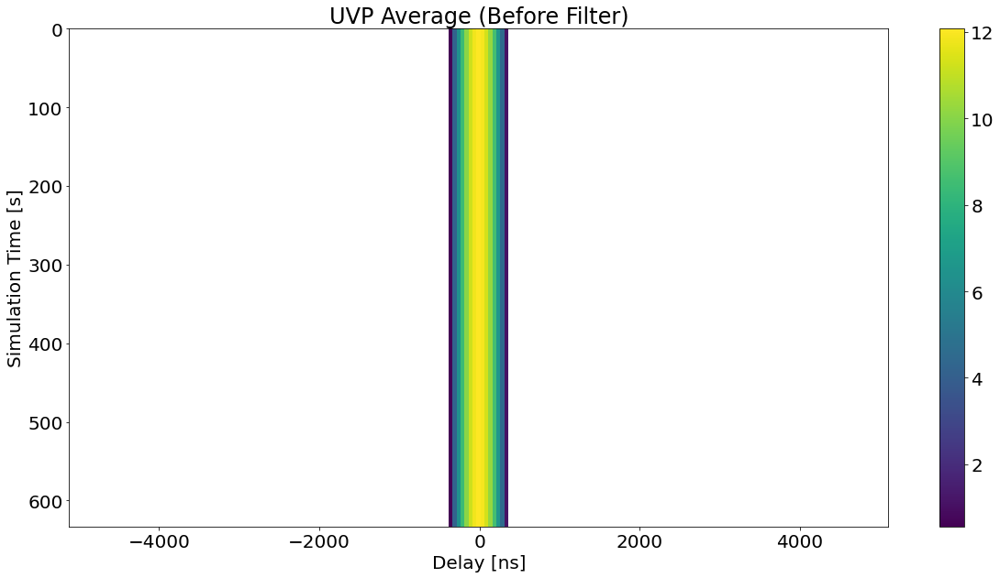

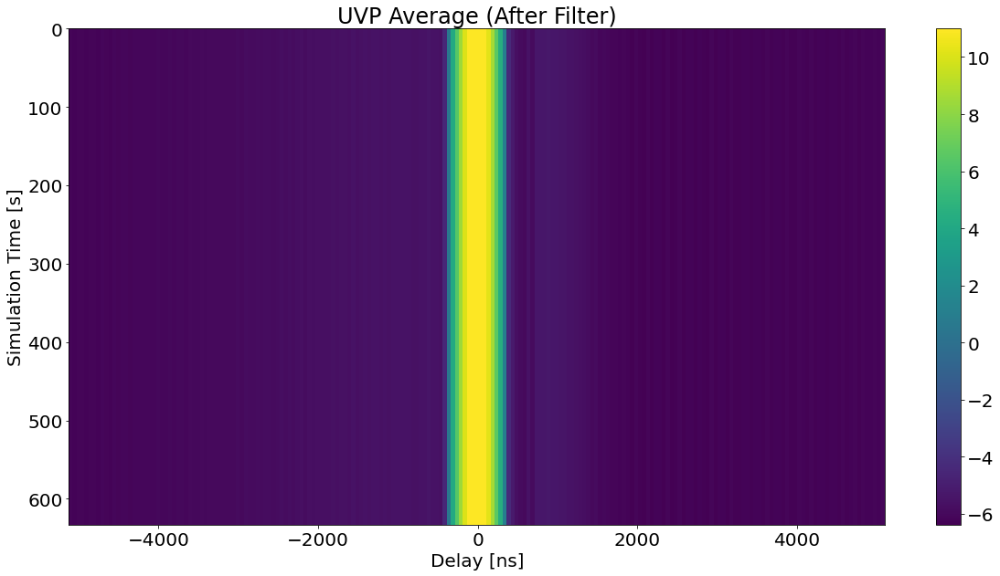

In [131]:
plt.imshow(np.log10(uvp_before.get_data((0,((0, 11), (1, 12)),('xx','xx'))).real), aspect='auto', extent=ext)
plt.colorbar()
plt.title('UVP Average (Before Filter)')
plt.xlabel('Delay [ns]')
plt.ylabel('Simulation Time [s]')
plt.figure()
plt.imshow(np.log10(uvp_after.get_data((0,((0,11),(1,12)),('xx','xx'))).real), aspect='auto', vmax=11,extent=ext)
plt.colorbar()
plt.title('UVP Average (After Filter)')
plt.xlabel('Delay [ns]')
plt.ylabel('Simulation Time [s]')

invalid value encountered in log10


Text(0, 0.5, 'Simulation Time [s]')

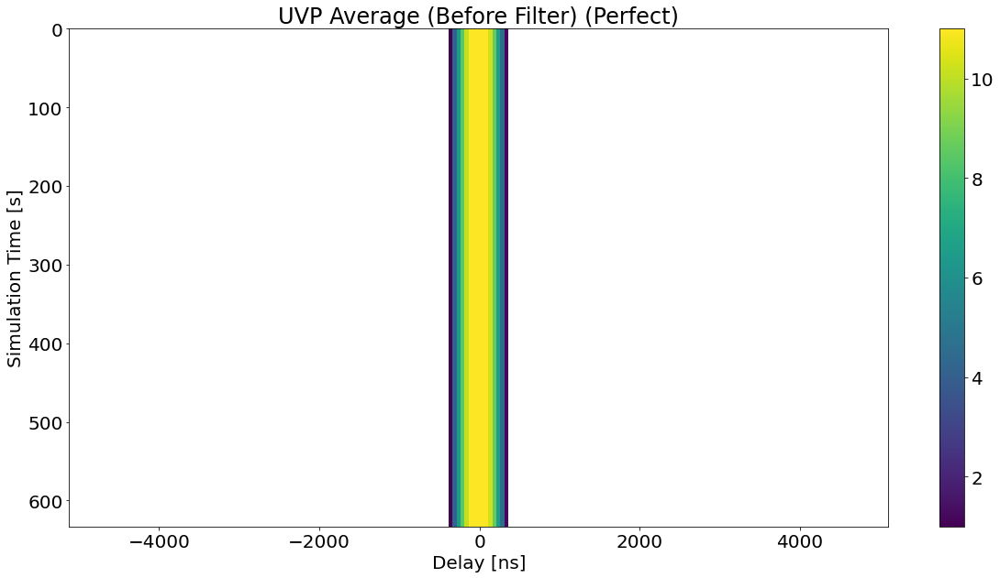

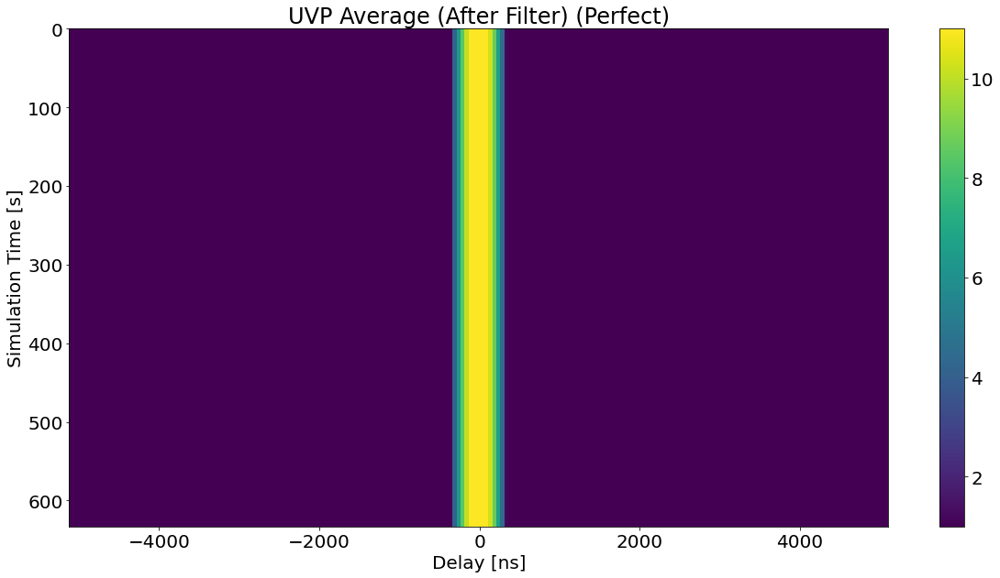

In [124]:
#Perfect

plt.imshow(np.log10(uvp_before_perfect.get_data((0,((0, 11), (1, 12)),('xx','xx'))).real), aspect='auto', vmin=1, vmax=11,extent=ext)
plt.colorbar()
plt.title('UVP Average (Before Filter) (Perfect)')
plt.xlabel('Delay [ns]')
plt.ylabel('Simulation Time [s]')
plt.figure()
plt.imshow(np.log10(uvp_after_perfect.get_data((0,((0,11),(1,12)),('xx','xx'))).real), aspect='auto', vmin=1, vmax=11,extent=ext)
plt.colorbar()
plt.title('UVP Average (After Filter) (Perfect)')
plt.xlabel('Delay [ns]')
plt.ylabel('Simulation Time [s]')

(0.0, 1.0)

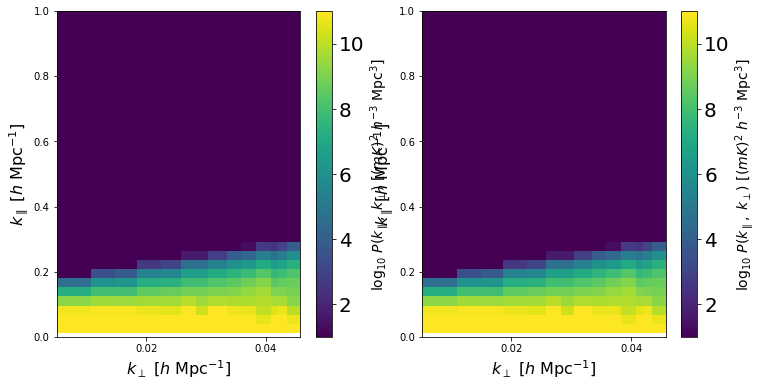

In [114]:
#Wedge Plots (Perfect)

fig,axarray = plt.subplots(1,2)
fig.set_size_inches(12,6)
plt.sca(axarray[0])
handle =pspec_plot.delay_wedge(uvp_before_perfect,spw=0,pol=('xx','xx'),fold=True,rotate=True, colorbar=True,
                               vmin=1,vmax=11, ax=axarray[0], delay=False)
plt.gca().set_ylim(0,1)
plt.sca(axarray[1])
handle = pspec_plot.delay_wedge(uvp_after_perfect,spw=0,pol=('xx','xx'),fold=True,rotate=True, colorbar=True,
                               vmin=1,vmax=11, ax=axarray[1], delay=False)
plt.gca().set_ylim(0,1)


(0.0, 1.0)

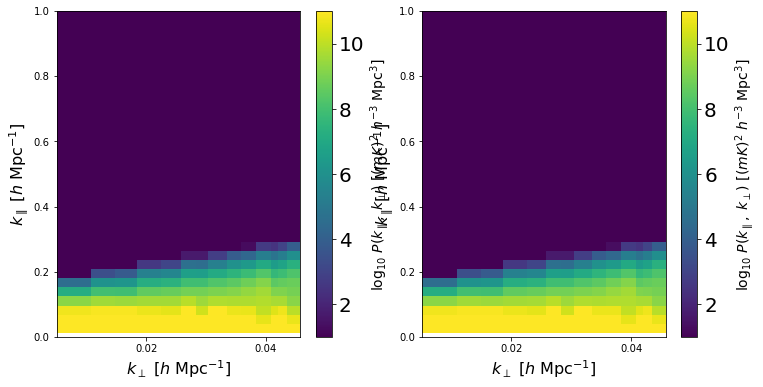

In [115]:
#Wedge Plots

fig,axarray = plt.subplots(1,2)
fig.set_size_inches(12,6)
plt.sca(axarray[0])
handle =pspec_plot.delay_wedge(uvp_before,spw=0,pol=('xx','xx'),fold=True,rotate=True, colorbar=True,
                               vmin=1,vmax=11, ax=axarray[0], delay=False)
plt.gca().set_ylim(0,1)
plt.sca(axarray[1])
handle = pspec_plot.delay_wedge(uvp_after,spw=0,pol=('xx','xx'),fold=True,rotate=True, colorbar=True,
                               vmin=1,vmax=11, ax=axarray[1], delay=False)
plt.gca().set_ylim(0,1)


In [116]:
#Get Radial Cosmological Wavevectors

k_data_before = uvp_before.get_kparas(0)[104::2]
k_bins_before = np.diff(k_data_before)
k_data_after = uvp_after.get_kparas(0)[104::2]
k_bins_after= np.diff(k_data_after)


k_data_before_perfect = uvp_before_perfect.get_kparas(0)[104::2]
k_bins_before_perfect = np.diff(k_data_before_perfect)
k_data_after_perfect = uvp_after_perfect.get_kparas(0)[104::2]
k_bins_after_perfect= np.diff(k_data_after_perfect)


#Perform a Spherical Average
uvp_before_sph = grouping.spherical_average(uvp_in=uvp_before,kbins=k_data_before[:-1], bin_widths=k_bins_before)
uvp_after_sph = grouping.spherical_average(uvp_in=uvp_after,kbins=k_data_after[:-1], bin_widths=k_bins_after)

uvp_before_sph_perfect = grouping.spherical_average(uvp_in=uvp_before_perfect,kbins=k_data_before_perfect[:-1], bin_widths=k_bins_before_perfect)
uvp_after_sph_perfect = grouping.spherical_average(uvp_in=uvp_after_perfect,kbins=k_data_after_perfect[:-1], bin_widths=k_bins_after_perfect)



Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part
Casting complex values to real discards the imaginary part


Text(0.5, 0, '$k$ [$hMpc^{-1}$]')

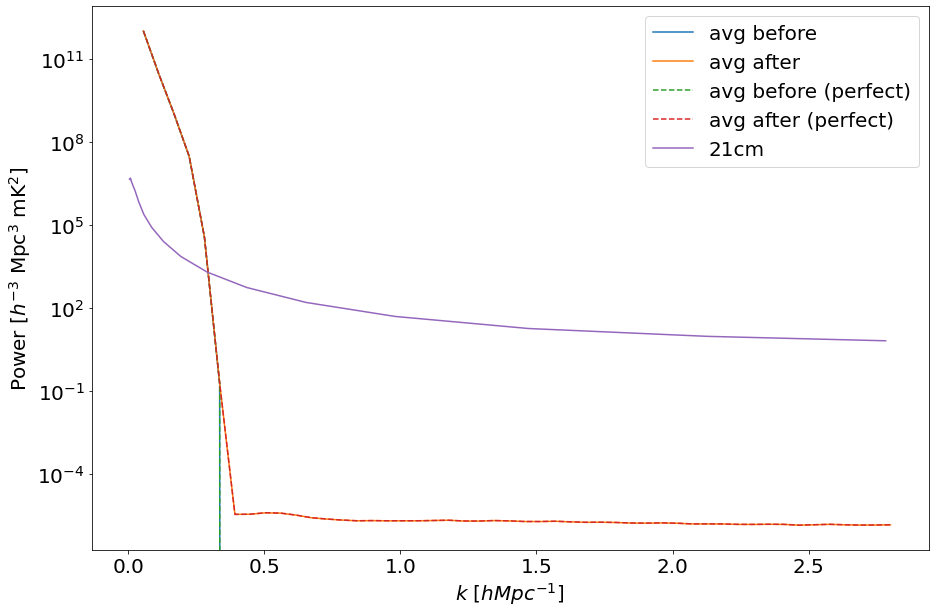

In [117]:
file = 'ps_no_halos_z008.46_nf0.581596_useTs1_NX2.0e-01_alphaX1.5_TvirminX2.0e+05_aveTb001 (1).53_Pop2_1024_1600Mpc_v3'
delta_21 = np.loadtxt(file, usecols=1)
k = np.loadtxt(file,usecols=0)
plt.figure(figsize=(15,10))

plt.plot(k_data_before[:-1], uvp_before_sph.get_data((0, ((0, 11), (1, 12)), ('xx', 'xx')))[0], label='avg before')
plt.plot(k_data_after[:-1], uvp_after_sph.get_data((0, ((0, 11), (1, 12)), ('xx', 'xx')))[0],label='avg after')
plt.plot(k_data_before_perfect[:-1], uvp_before_sph_perfect.get_data((0, ((0, 11), (1, 12)), ('xx', 'xx')))[0],linestyle='--', label='avg before (perfect)')
plt.plot(k_data_after_perfect[:-1], uvp_after_sph_perfect.get_data((0, ((0, 11), (1, 12)), ('xx', 'xx')))[0],linestyle='--',label='avg after (perfect)')
plt.plot(k,(delta_21/k**3)*2*np.pi**2, label='21cm')
plt.yscale('log')
plt.legend()
plt.ylabel('Power [$h^{-3}$ Mpc$^3$ mK$^2$]')
plt.xlabel('$k$ [$hMpc^{-1}$]')

Telescope hera_sim is not in known_telescopes.
Telescope hera_sim is not in known_telescopes.
Telescope hera_sim is not in known_telescopes.
Telescope hera_sim is not in known_telescopes.
Telescope hera_sim is not in known_telescopes.


Text(0.5, 1.0, 'Long BL')

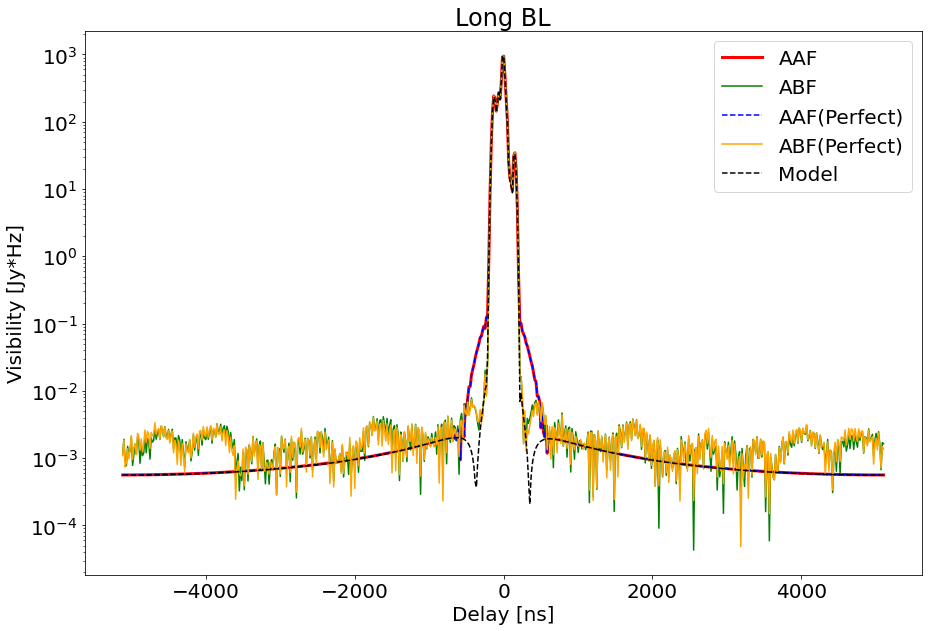

In [118]:
hd = HERAData("AverageAfterFilter_NonRedun/data_avg_0_filtered.uvh5")
data, flags, nsamples = hd.read()
hd2 = HERAData("AverageBeforeFilter_NonRedun/data_avg_0_filtered.uvh5")
data2, flags2, nsamples2 = hd2.read()
hd3 = HERAData("AverageAfterFilter_NonRedun_Perfect/data_avg_0_filtered.uvh5")
data3, flags3, nsamples3 = hd3.read()
hd4 = HERAData("AverageBeforeFilter_NonRedun_Perfect/data_avg_0_filtered.uvh5")
data4, flags4, nsamples4 = hd4.read()
hd5 = HERAData("/lustre/aoc/projects/hera/schoudhu/vis_redun_60time.uvh5")
data5, flags5, nsamples5 = hd5.read()
bh = dspec.gen_window('bh',614)
jul = 24*3600             #julian date to seconds
interpolated_times = (hd.times -hd.times.min())*jul
delay_blh = np.fft.fftshift(np.fft.fftfreq(614,data.freqs[1] - data.freqs[0]))
ext = (delay_blh.min()*1e+9, delay_blh.max()*1e+9, interpolated_times.max(), interpolated_times.min())
ext2 = (data.freqs[0]/1e6, data.freqs[-1]/1e6, interpolated_times.max(), interpolated_times.min())
plt.figure(figsize=(15,10))
def fft(x):
    return np.abs(np.fft.fftshift(np.fft.fft(np.fft.fftshift(x))))
plt.plot(delay_blh*1e+9,fft(bh*(data[(11,14,'ee')][10])),color='r',linewidth=3, label='AAF')
plt.plot(delay_blh*1e+9,fft(bh*(data2[(11,14,'ee')][10])),'g', label='ABF')
plt.plot(delay_blh*1e+9,fft(bh*(data3[(11,14,'ee')][10])),'b',linestyle='--', label='AAF(Perfect)')
plt.plot(delay_blh*1e+9,fft(bh*(data4[(11,14,'ee')][10])),'orange', label='ABF(Perfect)')
plt.plot(delay_blh*1e+9,fft(bh*(data5[(11,14,'ee')][10])),'k',linestyle='--', label='Model')
plt.xlabel('Delay [ns]')
plt.ylabel('Visibility [Jy*Hz]')
plt.yscale('log')
plt.legend()
plt.title('Long BL')

Telescope hera_sim is not in known_telescopes.
Telescope hera_sim is not in known_telescopes.
Telescope hera_sim is not in known_telescopes.
Telescope hera_sim is not in known_telescopes.
Telescope hera_sim is not in known_telescopes.


Text(0.5, 1.0, 'Short BL')

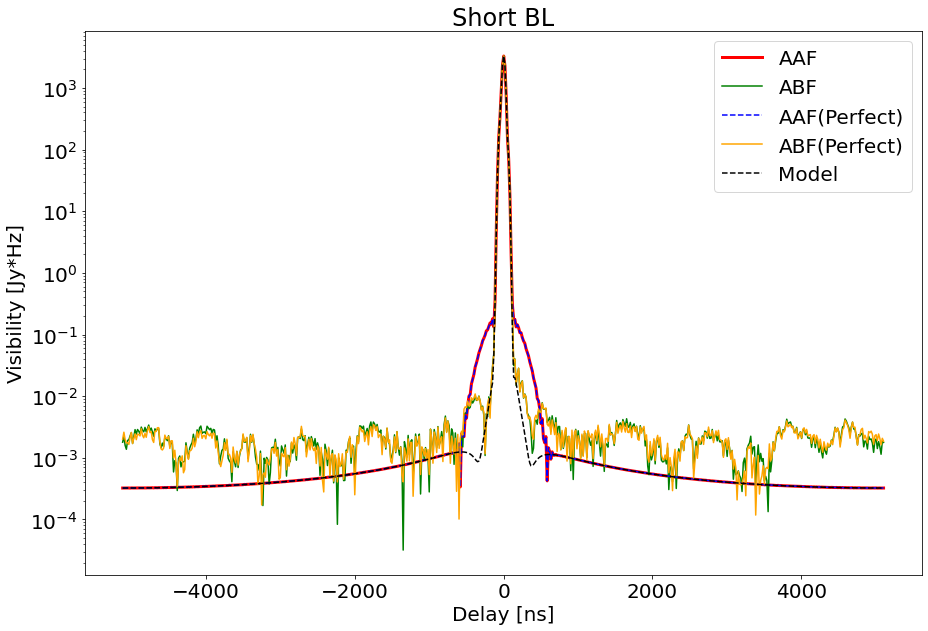

In [119]:
hd = HERAData("AverageAfterFilter_NonRedun/data_avg_0_filtered.uvh5")
data, flags, nsamples = hd.read()
hd2 = HERAData("AverageBeforeFilter_NonRedun/data_avg_0_filtered.uvh5")
data2, flags2, nsamples2 = hd2.read()
hd3 = HERAData("AverageAfterFilter_NonRedun_Perfect/data_avg_0_filtered.uvh5")
data3, flags3, nsamples3 = hd3.read()
hd4 = HERAData("AverageBeforeFilter_NonRedun_Perfect/data_avg_0_filtered.uvh5")
data4, flags4, nsamples4 = hd4.read()
hd5 = HERAData("/lustre/aoc/projects/hera/schoudhu/vis_redun_60time.uvh5")
data5, flags5, nsamples5 = hd5.read()
bh = dspec.gen_window('bh',614)
jul = 24*3600             #julian date to seconds
interpolated_times = (hd.times -hd.times.min())*jul
delay_blh = np.fft.fftshift(np.fft.fftfreq(614,data.freqs[1] - data.freqs[0]))
ext = (delay_blh.min()*1e+9, delay_blh.max()*1e+9, interpolated_times.max(), interpolated_times.min())
ext2 = (data.freqs[0]/1e6, data.freqs[-1]/1e6, interpolated_times.max(), interpolated_times.min())
plt.figure(figsize=(15,10))
def fft(x):
    return np.abs(np.fft.fftshift(np.fft.fft(np.fft.fftshift(x))))
plt.plot(delay_blh*1e+9,fft(bh*(data[(0,1,'ee')][10])),color='r',linewidth=3, label='AAF')
plt.plot(delay_blh*1e+9,fft(bh*(data2[(0,1,'ee')][10])),'g', label='ABF')
plt.plot(delay_blh*1e+9,fft(bh*(data3[(0,1,'ee')][10])),'b',linestyle='--', label='AAF(Perfect)')
plt.plot(delay_blh*1e+9,fft(bh*(data4[(0,1,'ee')][10])),'orange', label='ABF(Perfect)')
plt.plot(delay_blh*1e+9,fft(bh*(data5[(0,1,'ee')][10])),'k',linestyle='--', label='Model')
plt.xlabel('Delay [ns]')
plt.ylabel('Visibility [Jy*Hz]')
plt.yscale('log')
plt.legend()
plt.title('Short BL')

Telescope hera_sim is not in known_telescopes.
Telescope hera_sim is not in known_telescopes.
Telescope hera_sim is not in known_telescopes.


Text(0.5, 1.0, 'Residual (Short BL)')

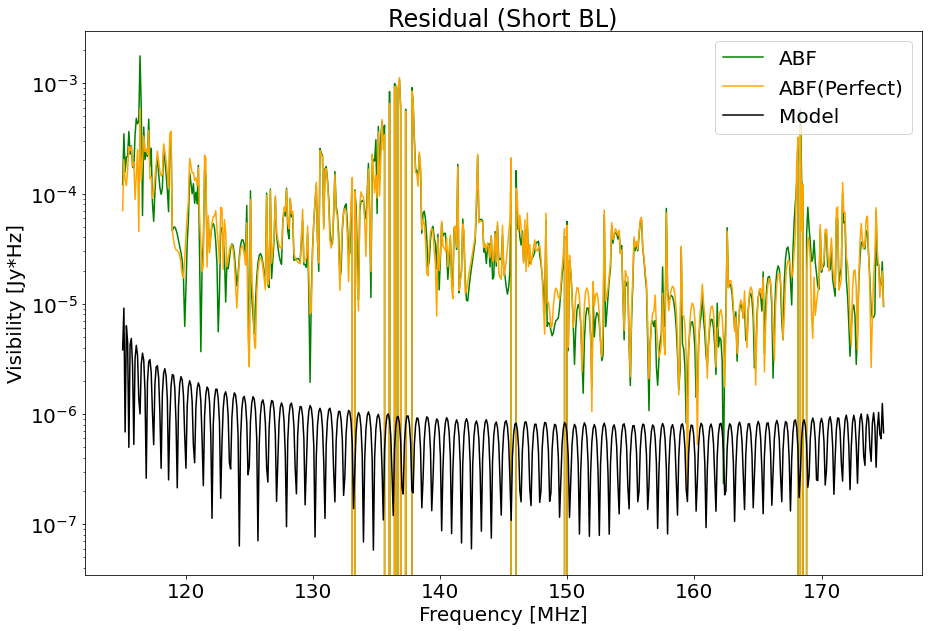

In [120]:
plt.figure(figsize=(15,10))
# hd = HERAData("AverageAfterFilter_NonRedun/data_avg_0_filtered_res.uvh5")
# data, flags, nsamples = hd.read()
# hd2 = HERAData("AverageAfterFilter_NonRedun_Perfect/data_avg_0_filtered_res.uvh5")
# data2, flags2, nsamples2 = hd2.read()
hd3 = HERAData("AverageBeforeFilter_NonRedun/data_avg_0_filtered_res2.uvh5")
data3, flags3, nsamples3 = hd3.read()
hd4 = HERAData("AverageBeforeFilter_NonRedun_Perfect/data_avg_0_filtered_res.uvh5")
data4, flags4, nsamples4 = hd4.read()
hd5 = HERAData("AverageBeforeFilter_NonRedun/data_avg_0_filtered_res.uvh5")
data5, flags5, nsamples5 = hd5.read()
# plt.plot(data.freqs/1e+6,abs(data[(0,1,'ee')][10]), label='AAF')
# plt.plot(data.freqs/1e+6,abs(data2[(0,1,'ee')][10]), label='AAF(Perfect)')
plt.plot(data.freqs/1e+6,abs(data3[(0,1,'ee')][10]),'g', label='ABF')
plt.plot(data.freqs/1e+6,abs(data4[(0,1,'ee')][10]),'orange', label='ABF(Perfect)')
plt.plot(data.freqs/1e+6,abs(data5[(0,1,'ee')][10]),'k', label='Model')
plt.xlabel('Frequency [MHz]')
plt.ylabel('Visibility [Jy*Hz]')
plt.legend()
plt.yscale('log')
plt.title("Residual (Short BL)")

Telescope hera_sim is not in known_telescopes.
Telescope hera_sim is not in known_telescopes.
Telescope hera_sim is not in known_telescopes.


Text(0.5, 1.0, 'Residual (Long BL)')

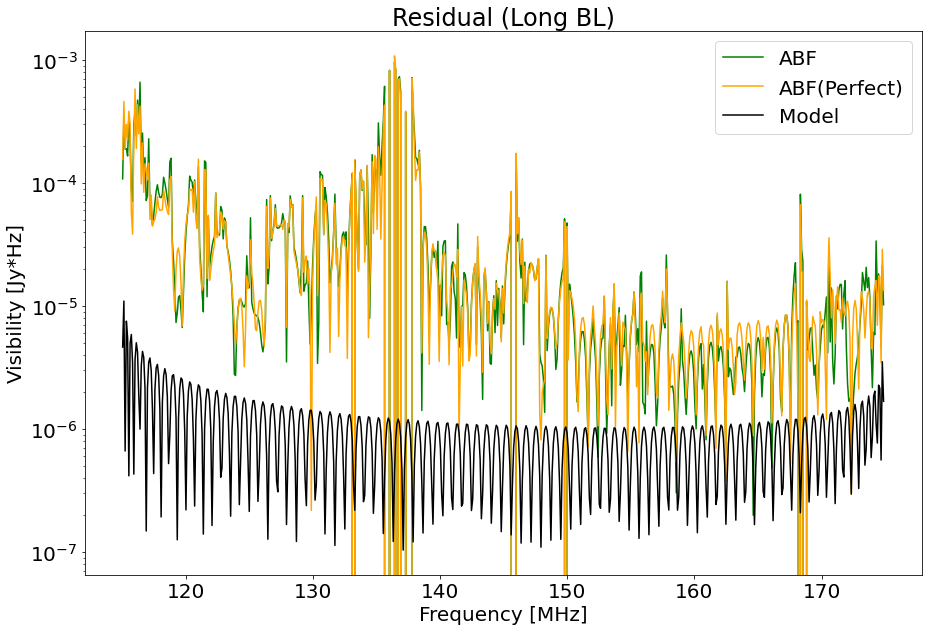

In [121]:
plt.figure(figsize=(15,10))
# hd = HERAData("AverageAfterFilter_NonRedun/data_avg_0_filtered_res.uvh5")
# data, flags, nsamples = hd.read()
# hd2 = HERAData("AverageAfterFilter_NonRedun_Perfect/data_avg_0_filtered_res.uvh5")
# data2, flags2, nsamples2 = hd2.read()
hd3 = HERAData("AverageBeforeFilter_NonRedun/data_avg_0_filtered_res2.uvh5")
data3, flags3, nsamples3 = hd3.read()
hd4 = HERAData("AverageBeforeFilter_NonRedun_Perfect/data_avg_0_filtered_res.uvh5")
data4, flags4, nsamples4 = hd4.read()
hd5 = HERAData("AverageBeforeFilter_NonRedun/data_avg_0_filtered_res.uvh5")
data5, flags5, nsamples5 = hd5.read()
# plt.plot(data.freqs/1e+6,abs(data[(11,14,'ee')][10]), label='AAF')
# plt.plot(data.freqs/1e+6,abs(data2[(11,14,'ee')][10]), label='AAF(Perfect)')
plt.plot(data.freqs/1e+6,abs(data3[(11,14,'ee')][10]),'g', label='ABF')
plt.plot(data.freqs/1e+6,abs(data4[(11,14,'ee')][10]),'orange', label='ABF(Perfect)')
plt.plot(data.freqs/1e+6,abs(data5[(11,14,'ee')][10]),'k', label='Model')
plt.xlabel('Frequency [MHz]')
plt.ylabel('Visibility [Jy*Hz]')
plt.legend()
plt.yscale('log')
plt.title("Residual (Long BL)")